# **What the Phase-Time Diagram Shows ?**


Synchronization: If the oscillators synchronize, their phases will converge in the phase-time diagram, forming parallel lines (or similar colors) as they lock into the same or close phase values.

Partial Synchronization: If there is only partial synchronization, some groups of oscillators will have similar phases, while others will remain out of phase, leading to band-like structures or clusters in the diagram.

Incoherent State: When there is little or no synchronization (e.g., low coupling constant
𝐾
< Kc), the phases of the oscillators remain scattered, showing no clear pattern or grouping over time.

Phase Drift and Locking: As time progresses, if the coupling strength
𝐾> Kc is sufficient, oscillators with initially different phases may drift toward each other and lock into the same phase. This transition from incoherence to coherence can be seen as lines converging over time.



At low values of
𝐾
< K, the oscillators may appear randomly scattered along the phase axis over time, reflecting no synchronization.
As
𝐾
K increases and reaches a critical threshold, groups of oscillators start to align, forming clusters.
At higher values of
𝐾>Kc, all oscillators may converge to a single phase, indicating global synchronization.

Although for different integration time dt, i.e. dt=0.5 and dt=0.01 we got different behaviour of phase time plot as shown in figures.

Below is the animation for integration time to be large ,0.5

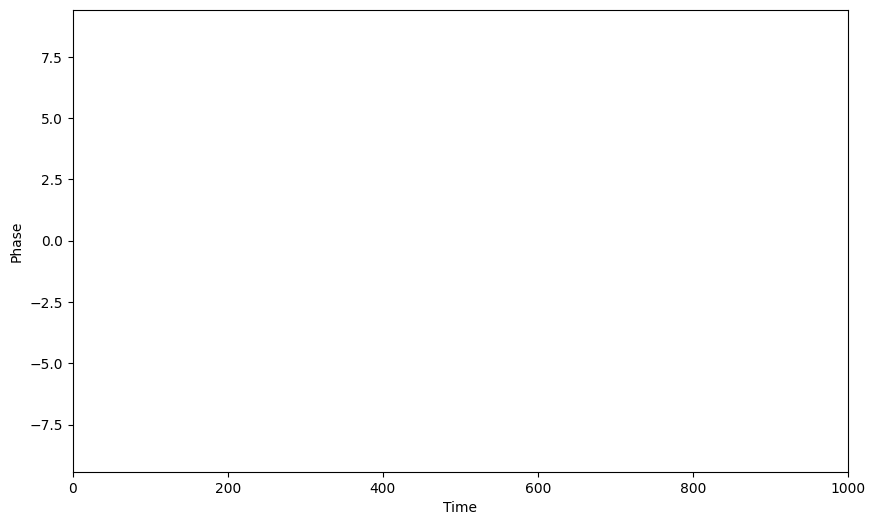

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Define the number of oscillators
N = 100

# Define the natural frequencies of the oscillators
omega = np.random.normal(0, 1, N)

# Define the initial phases of the oscillators
initial_theta = np.random.uniform(0, 2 * np.pi, N)

# Define the time step and the number of time steps
dt = 0.5
T = 1000

# Define coupling strengths to animate
K_values = np.linspace(0.05, 10.5, 30)

# Set up the figure and axis for animation with a larger size
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_xlim(0, 1000)  # Increased x-axis limit
ax.set_ylim(-3 * np.pi, 3 * np.pi)  # Increased y-axis limit
ax.set_xlabel('Time')
ax.set_ylabel('Phase')

# Initialization function for FuncAnimation
def init():
    ax.clear()
    ax.set_xlim(0, 1000)  # Set x-axis limit
    ax.set_ylim(-3 * np.pi, 3 * np.pi)  # Set y-axis limit
    ax.set_xlabel('Time')
    ax.set_ylabel('Phase')
    return ax

# Animation function that will plot for each value of K
def animate(K):
    # Reinitialize theta and theta_t for each K
    theta = initial_theta.copy()
    theta_t = np.zeros((T, N))
    theta_t[0] = theta

    # Run the simulation for each K value
    for t in range(1, T):
        for i in range(N):
            theta_t[t, i] = theta_t[t-1, i] + dt * (omega[i] + K / N * np.sum(np.sin(theta_t[t-1] - theta_t[t-1, i])))

    # Plot the phases over time for each oscillator
    ax.clear()  # Clear the previous plot
    for i in range(N):
        ax.plot(theta_t[:, i], alpha=0.6)  # Plot each oscillator’s phase over time
    ax.set_xlim(0, 1000)  # Set x-axis limit for each frame
    ax.set_ylim(-3 * np.pi, 3 * np.pi)  # Set y-axis limit for each frame
    ax.set_title(f"Coupling Strength K = {K:.2f}")
    ax.set_xlabel("Time")
    ax.set_ylabel("Phase")

    return ax

# Create the animation
ani = FuncAnimation(fig, animate, frames=K_values, init_func=init, blit=False, repeat=False)

# Display the animation in Google Colab
HTML(ani.to_jshtml())


# For Integration time dt= 0.01

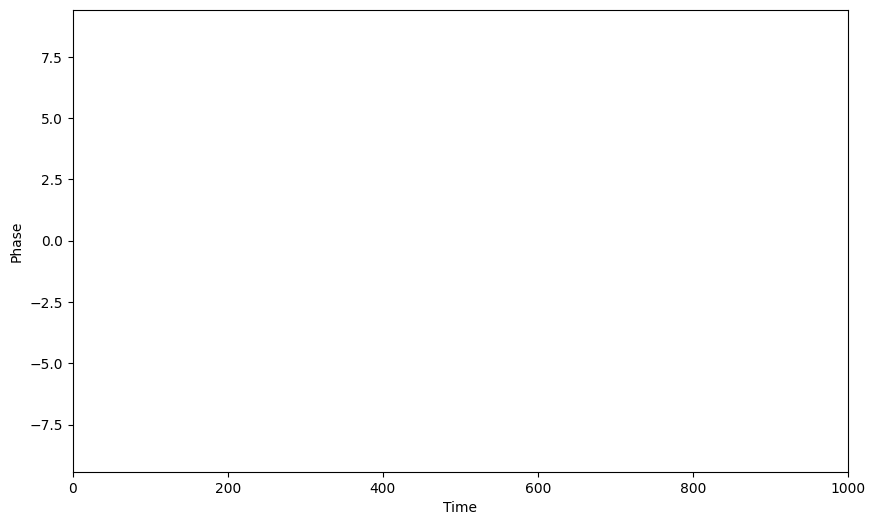

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Define the number of oscillators
N = 100

# Define the natural frequencies of the oscillators
omega = np.random.normal(0, 1, N)

# Define the initial phases of the oscillators
initial_theta = np.random.uniform(0, 2 * np.pi, N)

# Define the time step and the number of time steps
dt = 0.01
T = 1000

# Define coupling strengths to animate
K_values = np.linspace(0.05, 10.5, 30)

# Set up the figure and axis for animation with a larger size
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_xlim(0, 1000)  # Increased x-axis limit
ax.set_ylim(-3 * np.pi, 3 * np.pi)  # Increased y-axis limit
ax.set_xlabel('Time')
ax.set_ylabel('Phase')

# Initialization function for FuncAnimation
def init():
    ax.clear()
    ax.set_xlim(0, 1000)  # Set x-axis limit
    ax.set_ylim(-3 * np.pi, 3 * np.pi)  # Set y-axis limit
    ax.set_xlabel('Time')
    ax.set_ylabel('Phase')
    return ax

# Animation function that will plot for each value of K
def animate(K):
    # Reinitialize theta and theta_t for each K
    theta = initial_theta.copy()
    theta_t = np.zeros((T, N))
    theta_t[0] = theta

    # Run the simulation for each K value
    for t in range(1, T):
        for i in range(N):
            theta_t[t, i] = theta_t[t-1, i] + dt * (omega[i] + K / N * np.sum(np.sin(theta_t[t-1] - theta_t[t-1, i])))

    # Plot the phases over time for each oscillator
    ax.clear()  # Clear the previous plot
    for i in range(N):
        ax.plot(theta_t[:, i], alpha=0.6)  # Plot each oscillator’s phase over time
    ax.set_xlim(0, 1000)  # Set x-axis limit for each frame
    ax.set_ylim(-3 * np.pi, 3 * np.pi)  # Set y-axis limit for each frame
    ax.set_title(f"Coupling Strength K = {K:.2f}")
    ax.set_xlabel("Time")
    ax.set_ylabel("Phase")

    return ax

# Create the animation
ani = FuncAnimation(fig, animate, frames=K_values, init_func=init, blit=False, repeat=False)

# Display the animation in Google Colab
HTML(ani.to_jshtml())


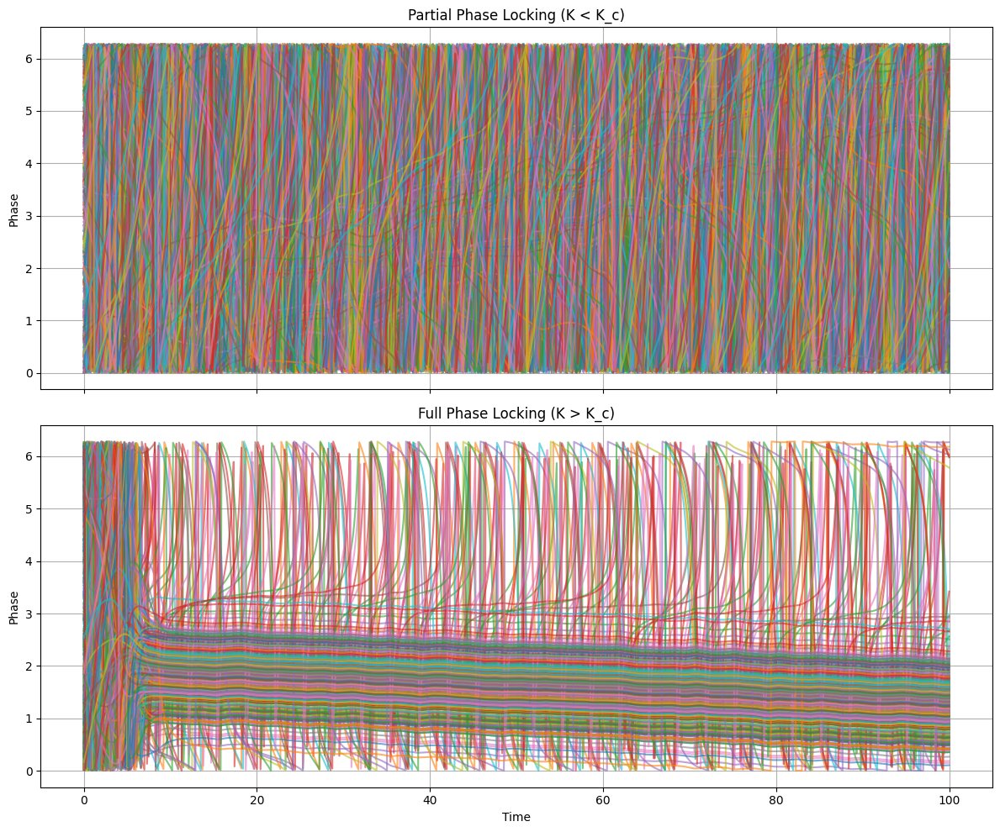

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define parameters
N = 500                 # Number of oscillators
omega_mean = 0.0        # Mean natural frequency
omega_std = 1.0         # Std deviation of natural frequencies
K_partial = 1.5         # Coupling for partial phase locking
K_full = 2.5            # Coupling for full phase locking
t_final = 100           # Final time
dt = 0.1                # Time step
t_steps = int(t_final / dt)
time = np.linspace(0, t_final, t_steps)

# Generate natural frequencies
omega = np.random.normal(omega_mean, omega_std, N)

# Define Kuramoto model step function
def kuramoto_step(theta, K):
    r = np.abs(np.sum(np.exp(1j * theta)) / N)  # Order parameter
    psi = np.angle(np.sum(np.exp(1j * theta)) / N)  # Mean phase
    dtheta_dt = omega + K * r * np.sin(psi - theta)  # Kuramoto equation
    return dtheta_dt

# Initialize theta for both cases
theta_partial = np.random.uniform(0, 2 * np.pi, N)  # Random initial condition for partial
theta_full = np.random.uniform(0, 2 * np.pi, N)     # Random initial condition for full

# Simulation arrays
theta_t_partial = np.zeros((t_steps, N))
theta_t_full = np.zeros((t_steps, N))
theta_t_partial[0] = theta_partial
theta_t_full[0] = theta_full

# Integrate the Kuramoto model for both partial and full phase locking
for t in range(1, t_steps):
    dtheta_dt_partial = kuramoto_step(theta_partial, K_partial)
    theta_partial += dtheta_dt_partial * dt
    theta_t_partial[t] = theta_partial  # Store for visualization

    dtheta_dt_full = kuramoto_step(theta_full, K_full)
    theta_full += dtheta_dt_full * dt
    theta_t_full[t] = theta_full  # Store for visualization

# Plot results
fig, axs = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

# Partial Phase Locking
for i in range(N):
    axs[0].plot(time, theta_t_partial[:, i] % (2 * np.pi), alpha=0.6)  # Plot phases modulo 2pi
axs[0].set_title('Partial Phase Locking (K < K_c)')
axs[0].set_ylabel('Phase')
axs[0].grid()

# Full Phase Locking
for i in range(N):
    axs[1].plot(time, theta_t_full[:, i] % (2 * np.pi), alpha=0.6)  # Plot phases modulo 2pi
axs[1].set_title('Full Phase Locking (K > K_c)')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Phase')
axs[1].grid()

plt.tight_layout()
plt.show()


I have fixed  g($\omega$) to be a Gaussian and vary the coupling
K as omega = np.random.normal(omega-mean, omega-std, N)with mean as 0 and standard deviation as 1 and Phases become uniformly distributed around the circle,
starting from any initial condition as by the condition : theta = np.random.uniform(0, 2 * np.pi, N) where N is the number of oscillator chosen that is 2000 for my case . We solved the kuramoto dynamical 1st order differential equations using both ranga kutta of order 4 and euler chromer method and compared the results along with predefined library odeint() and plotted r vs time  for different values of K . A r(t) , the magnitude of order parameter or the synchronization of oscillators we can see for smaller values of K r(t) for all oscillators remains almost 0 but there is a sudden jump of order parameter after K reaches a certain value Kc~2.0-2.5(as we are plotting r vs t for unifor K varries from 1.0 to 2.0 with step 0.1 ) . But when K exceeds Kc , this incoherent state becomes unstable and r(t) grows, reflecting the nucleation of a small cluster of oscillators that are mutually synchronized, thereby generating a collective oscillation.

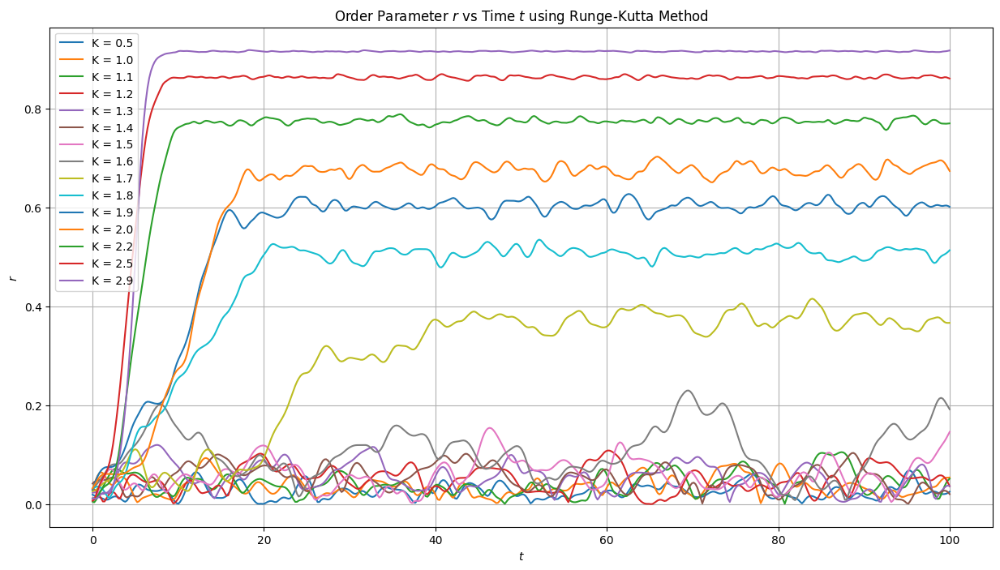

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the parameters
N = 2000  # Number of oscillators
omega_mean = 0.0  # Mean natural frequency
omega_std = 1.0  # Std deviation of natural frequencies

# Initialize natural frequencies from a Gaussian distribution
omega = np.random.normal(omega_mean, omega_std, N)

# Define the Kuramoto model
def kuramoto(theta, K):
    r = np.abs(np.sum(np.exp(1j * theta)) / N)  # Order parameter r
    psi = np.angle(np.sum(np.exp(1j * theta)) / N)  # Mean phase
    dtheta_dt = omega + K * r * np.sin(psi - theta)  # Kuramoto equation
    return dtheta_dt

# Runge-Kutta 4th order method
def runge_kutta(f, theta0, t, K):
    dt = t[1] - t[0]  # Time step size
    n_steps = len(t)
    theta_t = np.zeros((n_steps, N))
    theta_t[0] = theta0

    for i in range(1, n_steps):
        k1 = f(theta_t[i - 1], K)
        k2 = f(theta_t[i - 1] + 0.5 * dt * k1, K)
        k3 = f(theta_t[i - 1] + 0.5 * dt * k2, K)
        k4 = f(theta_t[i - 1] + dt * k3, K)

        # Update theta using the RK4 formula
        theta_t[i] = theta_t[i - 1] + (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)

    return theta_t

# Time variables
t = np.linspace(0, 100, 500)  # Time array for integration

# Coupling constants for the two graphs
K_values = [0.5, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0, 2.2, 2.5, 2.9]  # Below and above K_c

# Simulation and plotting
plt.figure(figsize=(15, 8))

# First plot: r(t) for various K values
for K in K_values:
    theta0 = np.random.uniform(0, 2* np.pi, N)  # Random initial condition

    # Integrate the Kuramoto model using Runge-Kutta
    theta_t = runge_kutta(kuramoto, theta0, t, K)

    # Compute the order parameter r(t) over time
    r_t = np.abs(np.sum(np.exp(1j * theta_t), axis=1) / N)

    # Plot r(t) for the values of K
    plt.plot(t, r_t, label=f'K = {K}')

plt.xlabel(r'$t$')
plt.ylabel(r'$r$')
plt.legend()
plt.title(r'Order Parameter $r$ vs Time $t$ using Runge-Kutta Method')
plt.grid()
plt.show()


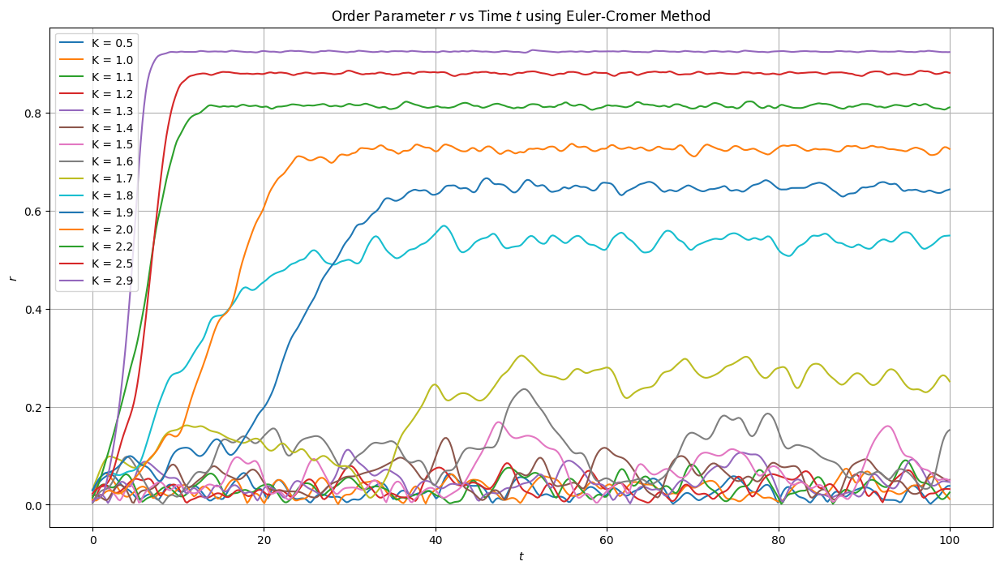

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the parameters
N = 2000  # Number of oscillators
omega_mean = 0.0  # Mean natural frequency
omega_std = 1.0  # Std deviation of natural frequencies

# Initialize natural frequencies from a Gaussian distribution
omega = np.random.normal(omega_mean, omega_std, N)

# Define the Kuramoto model
def kuramoto(theta, K):
    r = np.abs(np.sum(np.exp(1j * theta)) / N)  # Order parameter r
    psi = np.angle(np.sum(np.exp(1j * theta)) / N)  # Mean phase
    dtheta_dt = omega + K * r * np.sin(psi - theta)  # Kuramoto equation
    return dtheta_dt

# Euler-Cromer method
def euler_cromer(f, theta0, t, K):
    dt = t[1] - t[0]  # Time step size
    n_steps = len(t)
    theta_t = np.zeros((n_steps, N))
    theta_t[0] = theta0

    for i in range(1, n_steps):
        # Update theta using the Kuramoto equation
        dtheta_dt = f(theta_t[i - 1], K)
        theta_t[i] = theta_t[i - 1] + dtheta_dt * dt  # Euler update

    return theta_t

# Time variables
t = np.linspace(0, 100, 500)  # Time array for integration

# Coupling constants for the two graphs
K_values = [0.5, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0, 2.2, 2.5, 2.9]  # Below and above K_c

# Simulation and plotting
plt.figure(figsize=(15, 8))

# First plot: r(t) for various K values
for K in K_values:
    theta0 = np.random.uniform(0, 2* np.pi, N)  # Random initial condition

    # Integrate the Kuramoto model using Euler-Cromer
    theta_t = euler_cromer(kuramoto, theta0, t, K)

    # Compute the order parameter r(t) over time
    r_t = np.abs(np.sum(np.exp(1j * theta_t), axis=1) / N)

    # Plot r(t) for the values of K
    plt.plot(t, r_t, label=f'K = {K}')

plt.xlabel(r'$t$')
plt.ylabel(r'$r$')
plt.legend()
plt.title(r'Order Parameter $r$ vs Time $t$ using Euler-Cromer Method')
plt.grid()
plt.show()


Also if we play with different initial phases of the oscillators that is changing uniform distribution range from 0 to $\pi$ then oscillators for K greater than Kc  gets phase locked due to strong coupling with different mean  $r_{\infty}$ and those below Kc falls to 0  mean  $r_{\infty}$ due to low coupling over time.Also as we can see $r_{\infty}$ gets stabilized for greater values of  K. and if we cange the initial phase such that all the oscillator starts from 0 phase (which is the case for infinity coupling strength K ) some of the oscillators with K greater than Kc stabilizes to a fixed average $r_{\infty}$ and less fluctuations where as for oscillators with K less than Kc r(t) falls to 0 as time goes to infinity.

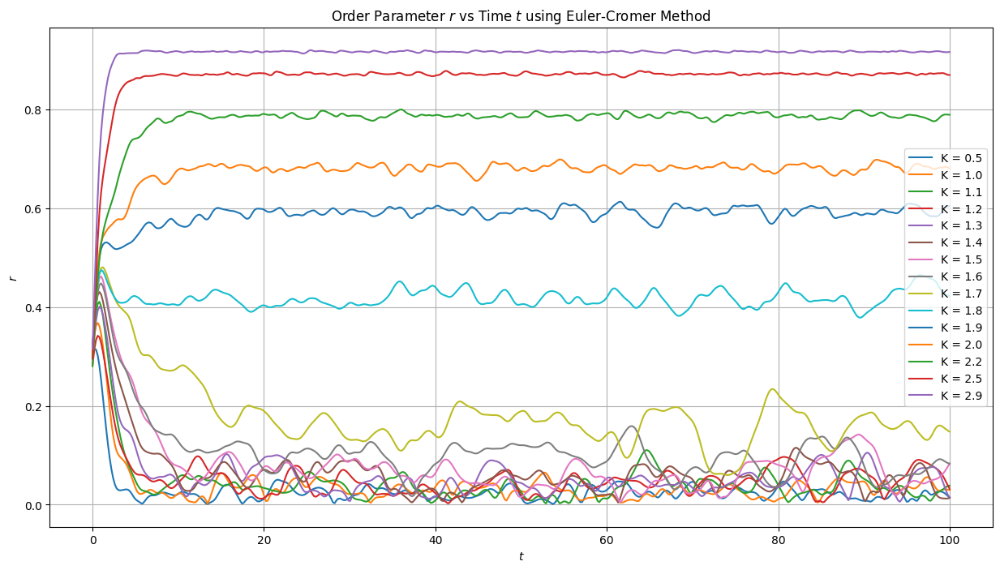

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the parameters
N = 2000  # Number of oscillators
omega_mean = 0.0  # Mean natural frequency
omega_std = 1.0  # Std deviation of natural frequencies

# Initialize natural frequencies from a Gaussian distribution
omega = np.random.normal(omega_mean, omega_std, N)

# Define the Kuramoto model
def kuramoto(theta, K):
    r = np.abs(np.sum(np.exp(1j * theta)) / N)  # Order parameter r
    psi = np.angle(np.sum(np.exp(1j * theta)) / N)  # Mean phase
    dtheta_dt = omega + K * r * np.sin(psi - theta)  # Kuramoto equation
    return dtheta_dt

# Euler-Cromer method
def euler_cromer(f, theta0, t, K):
    dt = t[1] - t[0]  # Time step size
    n_steps = len(t)
    theta_t = np.zeros((n_steps, N))
    theta_t[0] = theta0

    for i in range(1, n_steps):
        # Update theta using the Kuramoto equation
        dtheta_dt = f(theta_t[i - 1], K)
        theta_t[i] = theta_t[i - 1] + dtheta_dt * dt  # Euler update

    return theta_t

# Time variables
t = np.linspace(0, 100, 500)  # Time array for integration

# Coupling constants for the two graphs
K_values = [0.5, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0, 2.2, 2.5, 2.9]  # Below and above K_c

# Simulation and plotting
plt.figure(figsize=(15, 8))

# First plot: r(t) for various K values
for K in K_values:
    theta0 = np.random.uniform(0, 1.5*np.pi, N)  # Random initial condition

    # Integrate the Kuramoto model using Euler-Cromer
    theta_t = euler_cromer(kuramoto, theta0, t, K)

    # Compute the order parameter r(t) over time
    r_t = np.abs(np.sum(np.exp(1j * theta_t), axis=1) / N)

    # Plot r(t) for the values of K
    plt.plot(t, r_t, label=f'K = {K}')

plt.xlabel(r'$t$')
plt.ylabel(r'$r$')
plt.legend()
plt.title(r'Order Parameter $r$ vs Time $t$ using Euler-Cromer Method')
plt.grid()
plt.show()


# $r_{\infty}$ vs K plot :

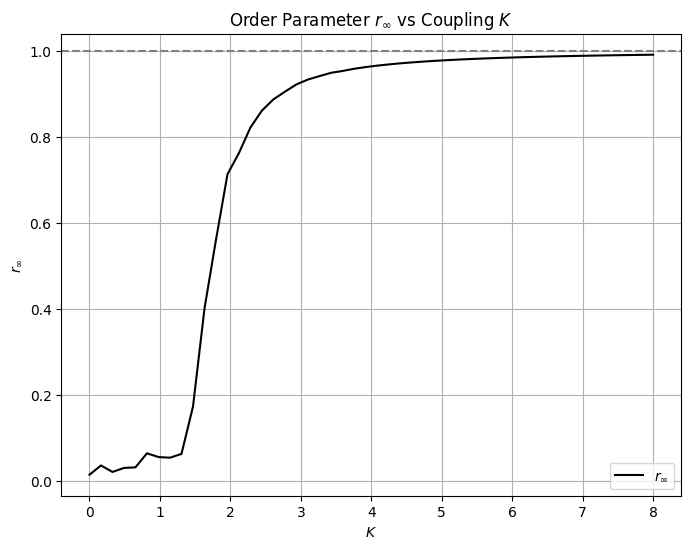

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define parameters
N = 2000  # Number of oscillators
omega_mean = 0.0  # Mean natural frequency
omega_std = 1.0  # Std deviation of natural frequencies
omega = np.random.normal(omega_mean, omega_std, N)

# Time variables for the integration
t_final = 200  # Long enough to reach equilibrium
dt = 0.1       # Time step
t_steps = int(t_final / dt)

# Range of K values to evaluate r_infinity
K_values = np.linspace(0, 8, 50)
r_inf = []

# Function to calculate dtheta/dt for the Kuramoto model
def kuramoto_step(theta, K):
    r = np.abs(np.sum(np.exp(1j * theta)) / N)
    psi = np.angle(np.sum(np.exp(1j * theta)) / N)
    dtheta_dt = omega + K * r * np.sin(psi - theta)
    return dtheta_dt

# 4th-order Runge-Kutta method for a single time step
def runge_kutta_step(theta, K, dt):
    k1 = kuramoto_step(theta, K)
    k2 = kuramoto_step(theta + 0.5 * k1 * dt, K)
    k3 = kuramoto_step(theta + 0.5 * k2 * dt, K)
    k4 = kuramoto_step(theta + k3 * dt, K)
    theta_next = theta + (k1 + 2 * k2 + 2 * k3 + k4) * dt / 6
    return theta_next

# Loop over each value of K to find r_infinity
for K in K_values:
    theta = np.random.uniform(0, 2 * np.pi, N)  # Initial random phase distribution

    # Time integration to reach equilibrium
    for _ in range(t_steps):
        theta = runge_kutta_step(theta, K, dt)

    # Calculate the final order parameter r after reaching steady state
    r_final = np.abs(np.sum(np.exp(1j * theta)) / N)
    r_inf.append(r_final)

# Plot r_infinity vs K
plt.figure(figsize=(8, 6))
plt.plot(K_values, r_inf, label=r'$r_\infty$', color='black')
plt.axhline(1, color='gray', linestyle='--')
plt.xlabel(r'$K$')
plt.ylabel(r'$r_\infty$')
plt.title(r'Order Parameter $r_\infty$ vs Coupling $K$')
plt.legend()
plt.grid()
plt.show()


# Using predefined odeint library:

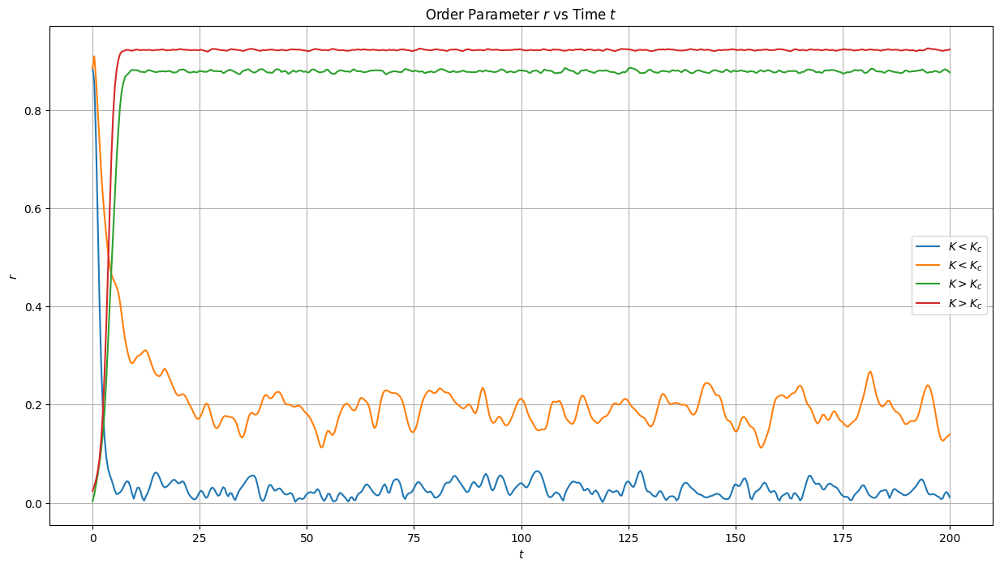

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint

# Define the parameters
N = 2000  # Number of oscillators
omega_mean = 0.0  # Mean natural frequency
omega_std = 1.0  # Std deviation of natural frequencies
K_c = 2.0  # Critical coupling constant (example value)

# Initialize natural frequencies from a Gaussian distribution
omega = np.random.normal(omega_mean, omega_std, N)

# Define the Kuramoto model
def kuramoto(theta, t, K):
    r = np.abs(np.sum(np.exp(1j * theta)) / N)  # Order parameter r
    psi = np.angle(np.sum(np.exp(1j * theta)) / N)  # Mean phase
    dtheta_dt = omega + K * r * np.sin(psi - theta)  # Kuramoto equation
    return dtheta_dt

# Time variables
t = np.linspace(0, 200, 500)  # Time array for integration

# Coupling constants for the two graphs
K_values = [0.5,1.5, 2.5,2.9]  # Below and above K_c

# Simulation and plotting
plt.figure(figsize=(15, 8))

# First plot: r(t) for K < K_c and K > K_c
for i, K in enumerate(K_values):
    # For K < K_c, start with a more coherent initial phase distribution
    if K < K_c:
        theta0 = np.random.normal(0, 0.5, N)  # Coherent initial condition
    else:
        theta0 = np.random.uniform(0, 2 * np.pi, N)  # Random initial condition

    # Integrate the Kuramoto model
    theta_t = odeint(kuramoto, theta0, t, args=(K,))

    # Compute the order parameter r(t) over time
    r_t = np.abs(np.sum(np.exp(1j * theta_t), axis=1) / N)

    # Plot r(t) for the two values of K
    label = r'$K > K_c$' if K > K_c else r'$K < K_c$'
    plt.plot(t, r_t, label=label)

plt.xlabel(r'$t$')
plt.ylabel(r'$r$')
plt.legend()
plt.title(r'Order Parameter $r$ vs Time $t$')
plt.grid()
plt.show()



# Using Euler method:

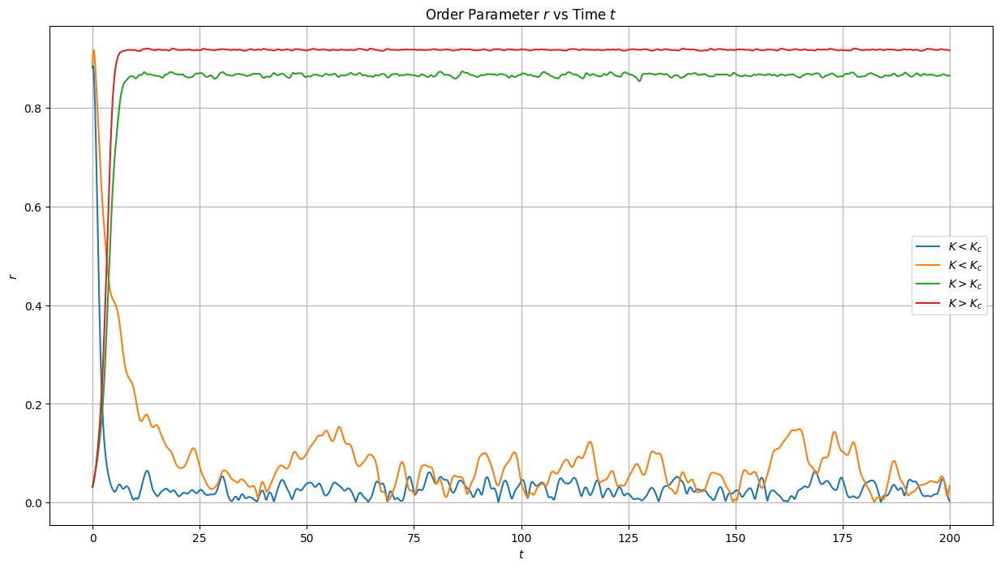

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the parameters
N = 2000  # Number of oscillators
omega_mean = 0.0  # Mean natural frequency
omega_std = 1.0  # Std deviation of natural frequencies
K_c = 2.0  # Critical coupling constant (example value)

# Initialize natural frequencies from a Gaussian distribution
omega = np.random.normal(omega_mean, omega_std, N)

# Define time variables
t_final = 200       # Final time
dt = 0.1            # Time step
t_steps = int(t_final / dt)
time = np.linspace(0, t_final, t_steps)

# Coupling constants for the two graphs
K_values = [0.5, 1.5, 2.5, 2.9]  # Below and above K_c

# Simulation and plotting
plt.figure(figsize=(15, 8))

# Function to update the oscillator phases
def kuramoto_step(theta, K):
    # Order parameter r and mean phase psi
    r = np.abs(np.sum(np.exp(1j * theta)) / N)
    psi = np.angle(np.sum(np.exp(1j * theta)) / N)

    # Calculate the change in theta using the Kuramoto equation
    dtheta_dt = omega + K * r * np.sin(psi - theta)
    return dtheta_dt

# Loop through each value of K
for K in K_values:
    # Initialize theta based on whether K < K_c or K > K_c
    if K < K_c:
        theta = np.random.normal(0, 0.5, N)  # Coherent initial condition for K < K_c
    else:
        theta = np.random.uniform(0, 2 * np.pi, N)  # Random initial condition for K > K_c

    # Array to store the order parameter r(t) over time
    r_t = np.zeros(t_steps)

    # Time integration using the Euler method
    for t in range(t_steps):
        r_t[t] = np.abs(np.sum(np.exp(1j * theta)) / N)  # Calculate order parameter
        dtheta_dt = kuramoto_step(theta, K)  # Get dtheta/dt
        theta += dtheta_dt * dt  # Update theta using Euler method

    # Plot r(t) for each K value
    label = r'$K > K_c$' if K > K_c else r'$K < K_c$'
    plt.plot(time, r_t, label=label)

# Plot settings
plt.xlabel(r'$t$')
plt.ylabel(r'$r$')
plt.legend()
plt.title(r'Order Parameter $r$ vs Time $t$')
plt.grid()
plt.show()


# Using Runge-kutta order 4 :

With further increases in K, more and more oscillators get into the
synchronized cluster, and $r_{\infty}$ grows , the simulation below suggestes that  $r_{\infty}$ depends only on K, and not
on the initial condition (globally attracting state)as all the oscillators starts with random uniform phases on circle as described above in the code.The graph has a sudden inflection or sudden increase near a value of K= 2.0
and at k tends to $\infty$ average r tends to 1.

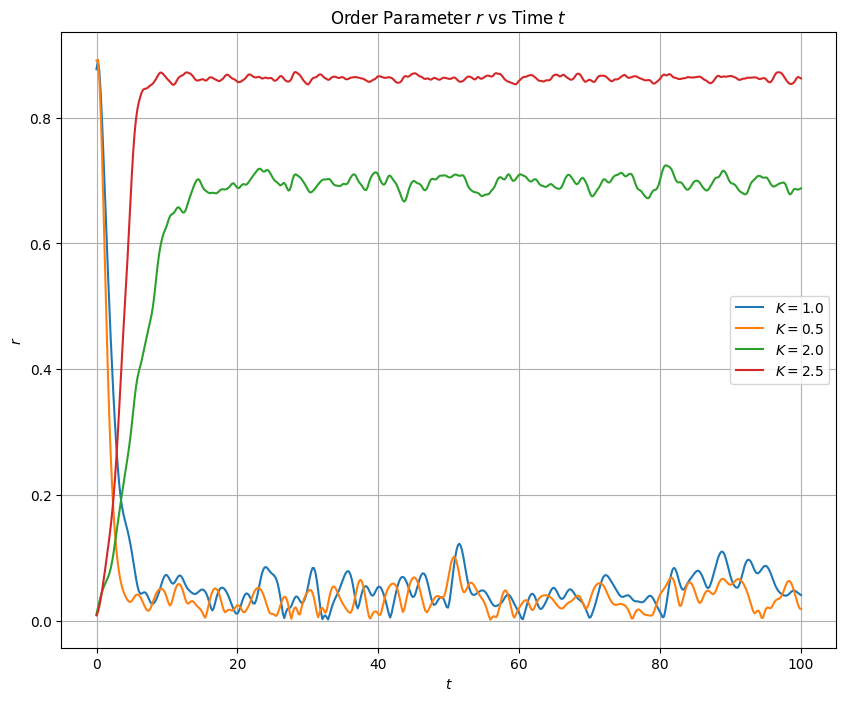

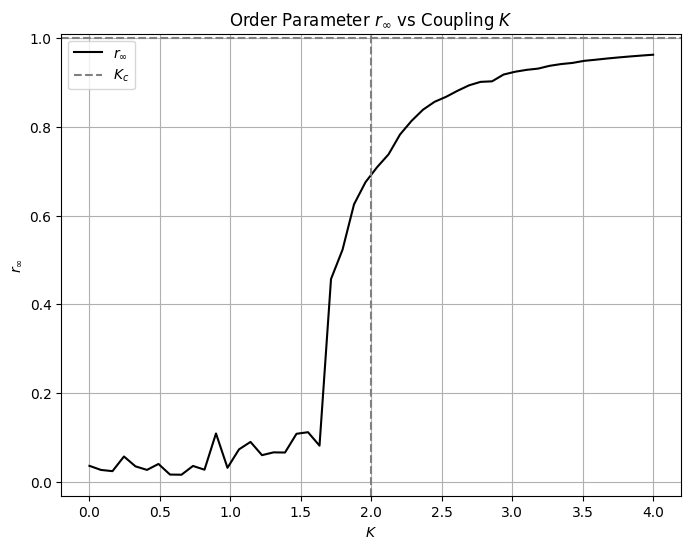

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the parameters
N = 1000  # Number of oscillators
omega_mean = 0.0  # Mean natural frequency
omega_std = 1.0  # Std deviation of natural frequencies
K_c = 2.0  # Critical coupling constant (example value)

# Initialize natural frequencies from a Gaussian distribution
omega = np.random.normal(omega_mean, omega_std, N)

# Define the Kuramoto model
def kuramoto(theta, K):
    r = np.abs(np.sum(np.exp(1j * theta)) / N)  # Order parameter r
    psi = np.angle(np.sum(np.exp(1j * theta)) / N)  # Mean phase
    dtheta_dt = omega + K * r * np.sin(psi - theta)  # Kuramoto equation
    return dtheta_dt

# Runge-Kutta (RK4) method
def runge_kutta(theta0, K, t):
    dt = t[1] - t[0]  # Time step
    theta_t = np.zeros((len(t), N))
    theta_t[0] = theta0

    for i in range(1, len(t)):
        theta = theta_t[i - 1]
        k1 = dt * kuramoto(theta, K)
        k2 = dt * kuramoto(theta + 0.5 * k1, K)
        k3 = dt * kuramoto(theta + 0.5 * k2, K)
        k4 = dt * kuramoto(theta + k3, K)
        theta_t[i] = theta + (k1 + 2 * k2 + 2 * k3 + k4) / 6

    return theta_t

# Time variables
t = np.linspace(0, 100, 500)  # Time array for integration

# Coupling constants for the two graphs
K_values = [1.0,0.5,2.0, 2.5]  # Below and above K_c

# Simulation and plotting
plt.figure(figsize=(10, 8))

# First plot: r(t) for K < K_c and K > K_c
for K in K_values:
    # For K < K_c, start with a more coherent initial phase distribution
    if K < K_c:
        theta0 = np.random.normal(0, 0.5, N)  # Coherent initial condition
    else:
        theta0 = np.random.uniform(0, 2 * np.pi, N)  # Random initial condition

    # Integrate the Kuramoto model using RK4
    theta_t = runge_kutta(theta0, K, t)

    # Compute the order parameter r(t) over time
    r_t = np.abs(np.sum(np.exp(1j * theta_t), axis=1) / N)

    # Plot r(t) for the two values of K
    plt.plot(t, r_t, label=f'$K = {K}$')

plt.xlabel(r'$t$')
plt.ylabel(r'$r$')
plt.legend()
plt.title(r'Order Parameter $r$ vs Time $t$')
plt.grid()
plt.show()

# Second plot: r_infinity vs K
K_values = np.linspace(0, 4, 50)  # Range of K values
r_inf = []

for K in K_values:
    theta0 = np.random.uniform(0, 2 * np.pi, N)
    theta_t = runge_kutta(theta0, K, t)
    r_t = np.abs(np.sum(np.exp(1j * theta_t[-1])) / N)  # r at t -> infinity
    r_inf.append(r_t)

plt.figure(figsize=(8, 6))
plt.plot(K_values, r_inf, label=r'$r_\infty$', color='black')
plt.axvline(K_c, color='gray', linestyle='--', label=r'$K_c$')
plt.axhline(1, color='gray', linestyle='--')
plt.xlabel(r'$K$')
plt.ylabel(r'$r_\infty$')
plt.title(r'Order Parameter $r_\infty$ vs Coupling $K$')
plt.legend()
plt.grid()
plt.show()


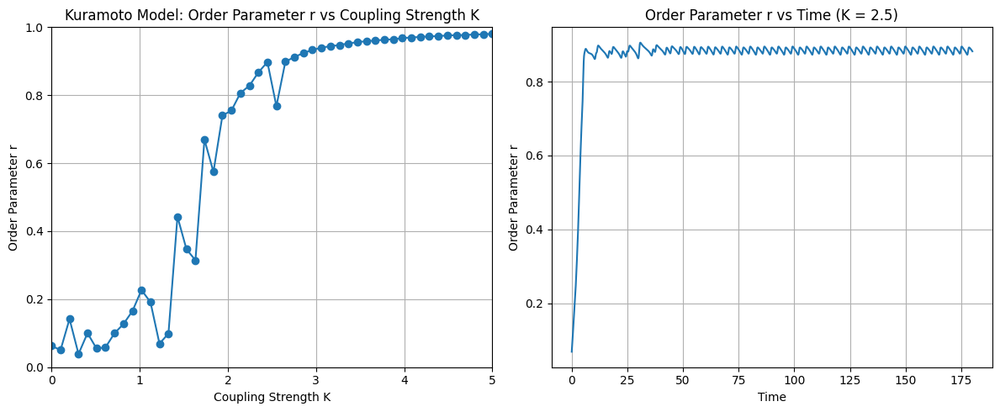

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
N = 100  # Number of oscillators
num_K_values = 50  # Number of K values to test
K_values = np.linspace(0, 5, num_K_values)  # Coupling strengths
omega = np.random.normal(0, 1, N)  # Natural frequencies of oscillators

# Function to compute the order parameter r
def compute_order_parameter(theta):
    r = np.abs(np.sum(np.exp(1j * theta)) / N)
    return r

# Store results for r vs K
r_values = []

# Simulation for different values of K
for K in K_values:
    # Initial phases
    theta = np.random.uniform(0, 2 * np.pi, N)

    # Time evolution
    dt = 0.01  # Time step
    T = 10  # Total time
    steps = int(T / dt)

    for _ in range(steps):
        # Update phases
        theta += (omega + K * compute_order_parameter(theta) * np.sin(np.mean(theta) - theta)) * dt

    # Compute the order parameter after simulation
    r = compute_order_parameter(theta)
    r_values.append(r)

# Plotting r vs K
plt.figure(figsize=(12, 5))

# Plot 1: Order Parameter r vs Coupling Strength K
plt.subplot(1, 2, 1)
plt.plot(K_values, r_values, marker='o')
plt.title('Kuramoto Model: Order Parameter r vs Coupling Strength K')
plt.xlabel('Coupling Strength K')
plt.ylabel('Order Parameter r')
plt.grid()
plt.xlim(0, 5)
plt.ylim(0, 1)

# Choose a specific K for time evolution
K_specific = 2.5  # You can change this value to test different K
theta = np.random.uniform(0, 2 * np.pi, N)  # Initial phases for time evolution
r_time_values = []  # Store r values over time

# Time evolution for a specific K
dt = 0.01  # Time step
T = 180  # Total time
steps = int(T / dt)

for _ in range(steps):
    # Update phases
    theta += (omega + K_specific * compute_order_parameter(theta) * np.sin(np.mean(theta) - theta)) * dt
    # Compute the order parameter at each time step
    r_time = compute_order_parameter(theta)
    r_time_values.append(r_time)

# Plot 2: Order Parameter r vs Time
plt.subplot(1, 2, 2)
plt.plot(np.linspace(0, T, steps), r_time_values)
plt.title(f'Order Parameter r vs Time (K = {K_specific})')
plt.xlabel('Time')
plt.ylabel('Order Parameter r')
plt.grid()

plt.tight_layout()
plt.show()

# Below is the plot for  $r(t)$ decays to size $O(1 / \sqrt{N})$, as expected for any random scatter of $N$ points on a circle.

We have considered N as uniform range from 10 to 4000 within a step of 10 and a fixed K value as 1.5 and plotted both Linear and log-log scale to see the dependency.

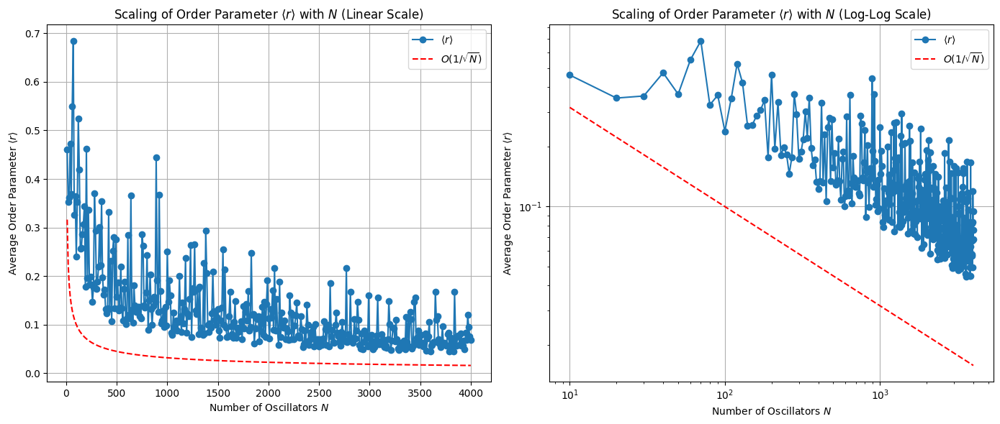

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
omega_mean = 0.0  # Mean natural frequency
omega_std = 1.0   # Std deviation of natural frequencies
K = 1.5           # Fixed coupling constant for testing

# Time variables
t = np.linspace(0, 100, 500)  # Time array for integration

# Define the Kuramoto model
def kuramoto(theta, omega, K, N):
    r = np.abs(np.sum(np.exp(1j * theta)) / N)  # Order parameter r
    psi = np.angle(np.sum(np.exp(1j * theta)) / N)  # Mean phase
    dtheta_dt = omega + K * r * np.sin(psi - theta)  # Kuramoto equation
    return dtheta_dt

# Runge-Kutta 4th order method
def runge_kutta(f, theta0, omega, t, K, N):
    dt = t[1] - t[0]  # Time step size
    n_steps = len(t)
    theta_t = np.zeros((n_steps, N))
    theta_t[0] = theta0

    for i in range(1, n_steps):
        k1 = f(theta_t[i - 1], omega, K, N)
        k2 = f(theta_t[i - 1] + 0.5 * dt * k1, omega, K, N)
        k3 = f(theta_t[i - 1] + 0.5 * dt * k2, omega, K, N)
        k4 = f(theta_t[i - 1] + dt * k3, omega, K, N)

        # Update theta using the RK4 formula
        theta_t[i] = theta_t[i - 1] + (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)

    return theta_t

# Range of N values with increments of 10
N_values = np.arange(10, 4001, 10)

# Store results
r_avg = []

# Simulation for each N
for N in N_values:
    omega = np.random.normal(omega_mean, omega_std, N)  # Natural frequencies
    theta0 = np.random.uniform(0, 2 * np.pi, N)  # Initial condition

    # Integrate the Kuramoto model
    theta_t = runge_kutta(kuramoto, theta0, omega, t, K, N)

    # Compute the order parameter r(t) over time
    r_t = np.abs(np.sum(np.exp(1j * theta_t), axis=1) / N)

    # Time-average of r(t) after initial transient
    r_avg.append(np.mean(r_t[100:]))

# Plot r vs. N (Linear scale)
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(N_values, r_avg, 'o-', label=r'$\langle r \rangle$')
plt.plot(N_values, 1/np.sqrt(N_values), 'r--', label=r'$O(1/\sqrt{N})$')
plt.xlabel(r'Number of Oscillators $N$')
plt.ylabel(r'Average Order Parameter $\langle r \rangle$')
plt.legend()
plt.title(r'Scaling of Order Parameter $\langle r \rangle$ with $N$ (Linear Scale)')
plt.grid()

# Plot r vs. N (Log-Log scale)
plt.subplot(1, 2, 2)
plt.plot(N_values, r_avg, 'o-', label=r'$\langle r \rangle$')
plt.plot(N_values, 1/np.sqrt(N_values), 'r--', label=r'$O(1/\sqrt{N})$')
plt.xlabel(r'Number of Oscillators $N$')
plt.ylabel(r'Average Order Parameter $\langle r \rangle$')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.title(r'Scaling of Order Parameter $\langle r \rangle$ with $N$ (Log-Log Scale)')
plt.grid()

plt.tight_layout()
plt.show()

I have also tried to animate the no phase locking , full phase locking and partial phase locking phenomena where the population splits into two groups: the oscillators near the
center of the frequency distribution lock together at the mean
frequency Ω and co-rotate with the average phase Ψ(t), while
those in the tails run near their natural frequencies and drift
relative to the synchronized cluster.The animation is being done with two different initial distribution one is uniform distribution and another one is Gaussian centered at 0 .This replicated the same graph as above in real time.

For uniform random phase distribution:

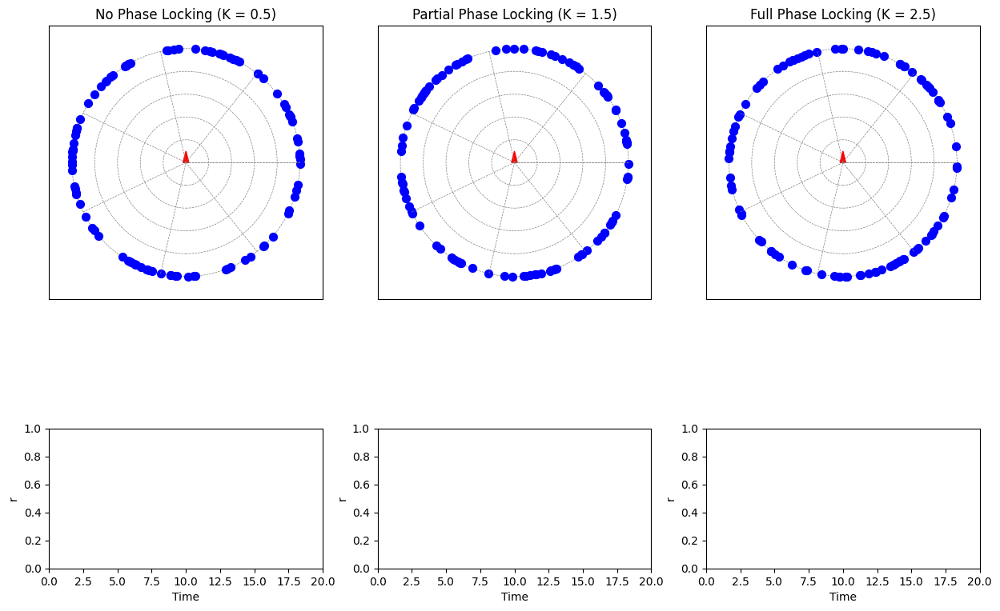

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Parameters
N = 100                 # Number of oscillators
omega_mean = 0.0        # Mean natural frequency
omega_std = 1.0         # Std deviation of natural frequencies
t_final = 20            # Final time for simulation
dt = 0.1                # Time step
t_steps = int(t_final / dt)
time = np.linspace(0, t_final, t_steps)

# Coupling strengths for different phase locking scenarios
K_values = [0.5, 2.0, 2.5]  # No locking, partial locking, full locking
titles = ["No Phase Locking (K = 0.5)", "Partial Phase Locking (K = 1.5)", "Full Phase Locking (K = 2.5)"]

# Generate natural frequencies
omega = np.random.normal(omega_mean, omega_std, N)

# Function to run Kuramoto simulation for a given K value
def simulate_kuramoto(K):
    theta = np.random.uniform(0, 2 * np.pi, N)  # Initial random phases
    theta_t = np.zeros((t_steps, N))
    theta_t[0] = theta
    r_values = np.zeros(t_steps)  # Array to store r values over time
    psi_values = np.zeros(t_steps)  # Array to store mean phase psi over time

    # Run simulation
    for t in range(1, t_steps):
        r = np.abs(np.sum(np.exp(1j * theta)) / N)  # Order parameter magnitude
        psi = np.angle(np.sum(np.exp(1j * theta)) / N)  # Order parameter angle
        r_values[t] = r
        psi_values[t] = psi
        dtheta_dt = omega + K * r * np.sin(psi - theta)  # Kuramoto equation
        theta += dtheta_dt * dt
        theta_t[t] = theta
    return theta_t, r_values, psi_values

# Run simulations for each K value
simulations = [simulate_kuramoto(K) for K in K_values]
theta_t_all = [sim[0] for sim in simulations]
r_values_all = [sim[1] for sim in simulations]
psi_values_all = [sim[2] for sim in simulations]

# Set up the plot for the animation
fig, axs = plt.subplots(2, 3, figsize=(15, 10), gridspec_kw={'height_ratios': [3, 1]})
for ax, title in zip(axs[0], titles):
    ax.set_xlim(-1.2, 1.2)
    ax.set_ylim(-1.2, 1.2)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(title)
    ax.set_aspect('equal')  # Set aspect ratio to equal

    # Add circular and radial grid lines for a polar effect
    for radius in np.linspace(0.2, 1.0, 5):
        ax.add_artist(plt.Circle((0, 0), radius, color='gray', fill=False, linestyle='--', linewidth=0.5))
    for angle in np.linspace(0, 2 * np.pi, 8):
        x = np.cos(angle)
        y = np.sin(angle)
        ax.plot([0, x], [0, y], color='gray', linestyle='--', linewidth=0.5)

# Initialize scatter plots and arrows for each polar subplot
scatters = [ax.scatter([], [], c='b', s=50) for ax in axs[0]]
arrows = [ax.arrow(0, 0, 0, 0, color='red', head_width=0.05, head_length=0.1) for ax in axs[0]]

# Set up r vs time plots
r_lines = []
for ax, r_values in zip(axs[1], r_values_all):
    ax.set_xlim(0, t_final)
    ax.set_ylim(0, 1)
    ax.set_xlabel("Time")
    ax.set_ylabel("r")
    line, = ax.plot([], [], color='blue')
    r_lines.append(line)

# Animation function
def animate(i):
    for scat, theta_t, r_val, psi_val, arrow in zip(scatters, theta_t_all, r_values_all, psi_values_all, arrows):
        # Update scatter plot
        x = np.cos(theta_t[i])
        y = np.sin(theta_t[i])
        scat.set_offsets(np.c_[x, y])  # Update positions for each subplot

        # Update the arrow to represent the order parameter
        arrow.remove()  # Remove the previous arrow
        arrow = axs[0][scatters.index(scat)].arrow(0, 0, r_val[i] * np.cos(psi_val[i]), r_val[i] * np.sin(psi_val[i]),
                                                   color='red', head_width=0.05, head_length=0.1)

        arrows[scatters.index(scat)] = arrow  # Update arrow reference in the list

    for line, r_values in zip(r_lines, r_values_all):
        line.set_data(time[:i], r_values[:i])  # Update r vs time lines

    return scatters + r_lines + arrows

# Create the animation
ani = FuncAnimation(fig, animate, frames=t_steps, interval=50, blit=True)

# Display animation inline in Jupyter Notebook
from IPython.display import HTML
#HTML(ani.to_jshtml())


For Gaussian Distribution :

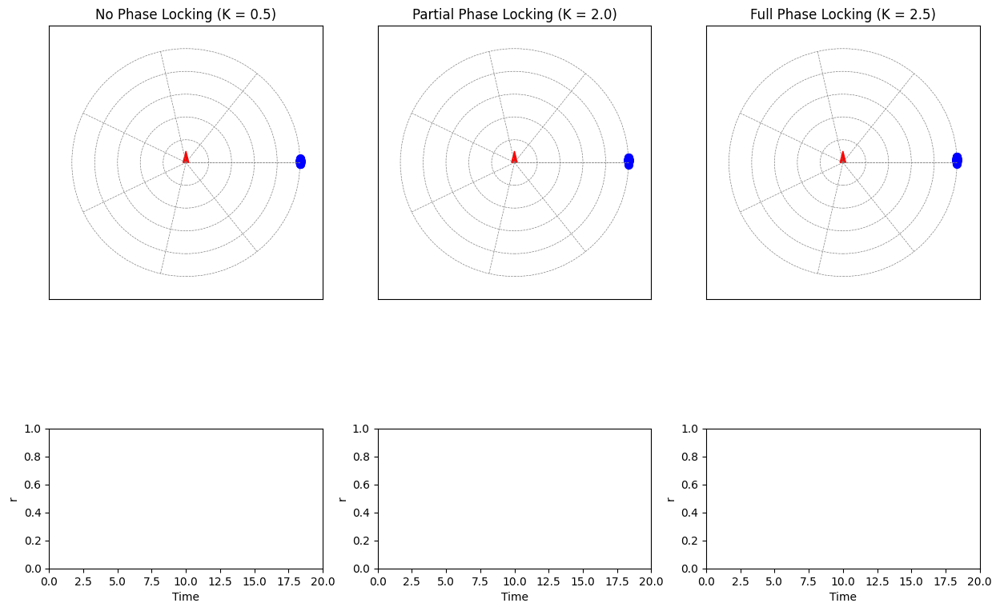

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Parameters
N = 100                 # Number of oscillators
omega_mean = 0.0        # Mean natural frequency
omega_std = 1.0         # Std deviation of natural frequencies
t_final = 20            # Final time for simulation
dt = 0.1                # Time step
t_steps = int(t_final / dt)
time = np.linspace(0, t_final, t_steps)

# Coupling strengths for different phase locking scenarios
K_values = [0.5, 2.0, 2.5]  # No locking, partial locking, full locking
titles = ["No Phase Locking (K = 0.5)", "Partial Phase Locking (K = 2.0)", "Full Phase Locking (K = 2.5)"]

# Generate natural frequencies
omega = np.random.normal(omega_mean, omega_std, N)

# Function to run Kuramoto simulation for a given K value
def simulate_kuramoto(K):
    # Initialize all oscillators close to the same phase
    initial_phase = np.random.uniform(0, 0.1)  # Small random offset
    theta = np.full(N, initial_phase) + np.random.normal(0, 0.01, N)  # Slight variations around the same phase
    theta_t = np.zeros((t_steps, N))
    theta_t[0] = theta
    r_values = np.zeros(t_steps)  # Array to store r values over time
    psi_values = np.zeros(t_steps)  # Array to store mean phase psi over time

    # Run simulation
    for t in range(1, t_steps):
        r = np.abs(np.sum(np.exp(1j * theta)) / N)  # Order parameter magnitude
        psi = np.angle(np.sum(np.exp(1j * theta)) / N)  # Order parameter angle
        r_values[t] = r
        psi_values[t] = psi
        dtheta_dt = omega + K * r * np.sin(psi - theta)  # Kuramoto equation
        theta += dtheta_dt * dt
        theta_t[t] = theta
    return theta_t, r_values, psi_values

# Run simulations for each K value
simulations = [simulate_kuramoto(K) for K in K_values]
theta_t_all = [sim[0] for sim in simulations]
r_values_all = [sim[1] for sim in simulations]
psi_values_all = [sim[2] for sim in simulations]

# Set up the plot for the animation
fig, axs = plt.subplots(2, 3, figsize=(15, 10), gridspec_kw={'height_ratios': [3, 1]})
for ax, title in zip(axs[0], titles):
    ax.set_xlim(-1.2, 1.2)
    ax.set_ylim(-1.2, 1.2)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(title)
    ax.set_aspect('equal')  # Set aspect ratio to equal

    # Add circular and radial grid lines for a polar effect
    for radius in np.linspace(0.2, 1.0, 5):
        ax.add_artist(plt.Circle((0, 0), radius, color='gray', fill=False, linestyle='--', linewidth=0.5))
    for angle in np.linspace(0, 2 * np.pi, 8):
        x = np.cos(angle)
        y = np.sin(angle)
        ax.plot([0, x], [0, y], color='gray', linestyle='--', linewidth=0.5)

# Initialize scatter plots and arrows for each polar subplot
scatters = [ax.scatter([], [], c='b', s=50) for ax in axs[0]]
arrows = [ax.arrow(0, 0, 0, 0, color='red', head_width=0.05, head_length=0.1) for ax in axs[0]]

# Set up r vs time plots
r_lines = []
for ax, r_values in zip(axs[1], r_values_all):
    ax.set_xlim(0, t_final)
    ax.set_ylim(0, 1)
    ax.set_xlabel("Time")
    ax.set_ylabel("r")
    line, = ax.plot([], [], color='blue')
    r_lines.append(line)

# Animation function
def animate(i):
    for scat, theta_t, r_val, psi_val, arrow in zip(scatters, theta_t_all, r_values_all, psi_values_all, arrows):
        # Update scatter plot
        x = np.cos(theta_t[i])
        y = np.sin(theta_t[i])
        scat.set_offsets(np.c_[x, y])  # Update positions for each subplot

        # Update the arrow to represent the order parameter
        arrow.remove()  # Remove the previous arrow
        arrow = axs[0][scatters.index(scat)].arrow(0, 0, r_val[i] * np.cos(psi_val[i]), r_val[i] * np.sin(psi_val[i]),
                                                   color='red', head_width=0.05, head_length=0.1)

        arrows[scatters.index(scat)] = arrow  # Update arrow reference in the list

    for line, r_values in zip(r_lines, r_values_all):
        line.set_data(time[:i], r_values[:i])  # Update r vs time lines

    return scatters + r_lines + arrows

# Create the animation
ani = FuncAnimation(fig, animate, frames=t_steps, interval=50, blit=True)

# Display animation inline in Jupyter Notebook
from IPython.display import HTML
#HTML(ani.to_jshtml())


I have also tried to plot a correlation matrix in real time where if

1)the correlation matrix of the Kuramoto model shows a strong diagonal line, this suggests that each oscillator is highly correlated with itself while correlations with other oscillators are weak. This diagonal pattern typically has the following implications:Phase Incoherence,Lack of synchronization and decoupled oscillators .

2)The presence of distinct blocks or patterns in the correlation matrix may indicate clusters of oscillators that are highly synchronized with each other. These clusters are likely to have similar phases and oscillate coherently.

3)If the correlation matrix shows varied or less-structured correlation values (a mix of strong and weak correlations), this could suggest that the oscillators are not fully synchronized or that there are subgroups with heterogeneous synchronization behaviors.

4)The presence of strong, consistent correlations (darker or lighter regions along the diagonal or in specific blocks) suggests that some oscillators are highly synchronized. If the correlations are high across the entire matrix, this would suggest global synchronization.

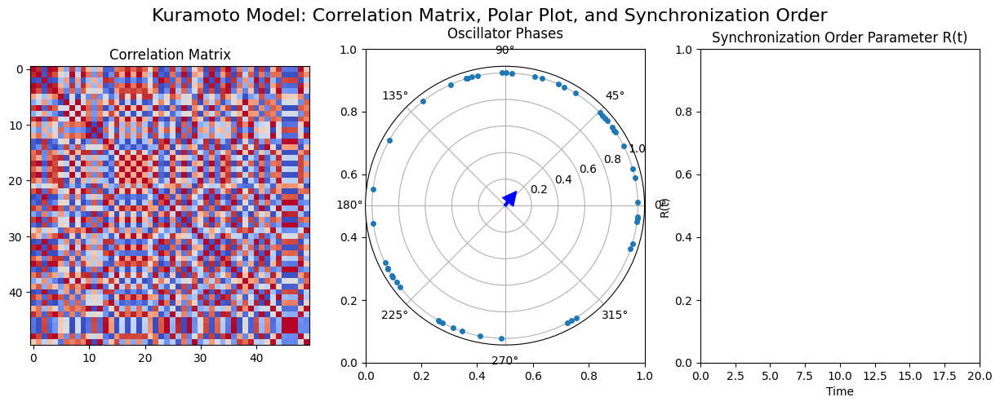

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Kuramoto model parameters
N = 50  # Number of oscillators
K = 1.5  # Coupling constant
dt = 0.05  # Time step
T = 20  # Total time for simulation
steps = int(T / dt)

# Natural frequencies with a narrow distribution for better synchronization
np.random.seed(0)
omega = 2 * np.pi * (np.random.normal(0, 0.1, N))  # Narrower frequency distribution

# Initialize phases randomly
theta = 2 * np.pi * np.random.rand(N)

# Function to update the phases based on the Kuramoto model
def kuramoto_step(theta, omega, K, dt):
    dtheta = omega + (K / N) * np.sum(np.sin(theta - theta[:, None]), axis=1)
    return theta + dtheta * dt

# Function to compute the synchronization order parameter R(t) as a complex number
def compute_order_parameter(theta):
    return np.sum(np.exp(1j * theta)) / N

# Set up the figure and axes
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle("Kuramoto Model: Correlation Matrix, Polar Plot, and Synchronization Order", fontsize=16)

# Correlation matrix plot
corr_matrix_plot = ax1.imshow(np.zeros((N, N)), vmin=-1, vmax=1, cmap='coolwarm')
ax1.set_title("Correlation Matrix")

# Polar plot setup
ax2 = plt.subplot(132, projection='polar')
ax2.set_title("Oscillator Phases")
points, = ax2.plot([], [], 'o', markersize=4)

# Arrow annotation for the synchronization order parameter R(t)
arrow = ax2.annotate('', xy=(0, 0), xytext=(0, 0),
                     arrowprops=dict(facecolor='blue', edgecolor='blue', shrink=0, width=2))

# Line to trace the trajectory of R(t) in polar plot
R_trail, = ax2.plot([], [], color='blue', lw=1)

# Line plot for the synchronization order parameter R(t)
ax3.set_xlim(0, T)
ax3.set_ylim(0, 1)
ax3.set_title("Synchronization Order Parameter R(t)")
ax3.set_xlabel("Time")
ax3.set_ylabel("R(t)")
order_parameter_line, = ax3.plot([], [], lw=2)

# Initialize arrays to store R(t) over time
time_data = np.linspace(0, T, steps)
R_data = np.zeros(steps)
R_trail_data = np.zeros((steps, 2))  # Stores trail of R(t) for the polar plot

# Animation update function
def update(frame):
    global theta

    # Update the phases using the Kuramoto step
    theta = kuramoto_step(theta, omega, K, dt)

    # Update the correlation matrix
    corr_matrix = np.cos(theta[:, None] - theta)
    corr_matrix_plot.set_array(corr_matrix)

    # Update the polar plot
    points.set_data(theta, np.ones(N))

    # Update R(t) as a complex number and get its magnitude and phase
    R_complex = compute_order_parameter(theta)
    R_magnitude = np.abs(R_complex)
    R_phase = np.angle(R_complex)

    # Update the arrow to represent R(t)
    arrow.xy = (R_phase, R_magnitude)  # Arrow points to the current R vector
    arrow.xytext = (0, 0)  # Start at the center

    # Update the R(t) trail
    R_trail_data[frame] = (R_phase, R_magnitude)
    R_trail.set_data(R_trail_data[:frame+1, 0], R_trail_data[:frame+1, 1])

    # Update the order parameter plot
    R_data[frame] = R_magnitude
    order_parameter_line.set_data(time_data[:frame+1], R_data[:frame+1])

    return corr_matrix_plot, points, order_parameter_line, arrow, R_trail

# Create animation
ani = FuncAnimation(fig, update, frames=steps, interval=50, blit=True)

from IPython.display import HTML
#HTML(ani.to_jshtml())


# **Firefly model as a demosntration (Extra-out of my curiosity):**



1.   List item
2.   List item


Each firefly $i$ has an inner clock, described by the phase $\theta \in[0,2 \pi)$ ), and a natural angular frequency $\omega_i=2 \pi f_i$, with $f_i$ being the frequency of the flashes. Both $\theta_i$ and $f_i$ are selected from a uniform distribution, with $\theta_i \in U(0,2 \pi)$ and $f_i \in U(\bar{f} \pm \Delta f, \bar{f} \pm \Delta f)$, where $\bar{f}$ the average flashing frequency and $\Delta f$ controls the width of the frequency distribution. To determine whether or not a specific firefly has its light on, a threshold parameter is defined $C \in[0,1)$ as

$$
C=\sin \left(\frac{1}{2} \pi-\omega T_{\text {flash }}\right)
$$

with $T_{\text {flash }}$ the flash duration, which we assume to be equal for all flies. One now assumes that that the light of firefly i is on when $\sin \left(\theta_i\right)>C$.

To determine whether or not two fireflies $i$ and $j$ are interacting, three conditions are imposed. First of all, the fireflies need to be in visual range of each other, that is, the distance between them is smaller than the visual radius $R$ of the flies. Secondly, the light of firefly $i$ must be off, while thirdly, firefly $j$ must have its light on. The phase change of $\theta_i$ due to interaction between fireflies $i$ and $j$ then leads to a phase adjustment by firefly $i$ according to

$$
\left(\frac{d \theta_i}{d t}\right)_j=K \sin \left(\theta_j-\theta_i\right)
$$

where $K$ is again the coupling strength.
To quantify the syncronisation first a centroid is introduced:

$$
r(t)=\frac{1}{N} \sum_{j=0}^N e^{i \theta_j(t)}
$$

where $i$ is this time the imaginary unit. Then, the order parameter is:

$$
\bar{r}=\lim _{T \rightarrow \infty} \int_{T_0}^{T_0+T}|r(t)| d t
$$

1.Number fireflies,N=35, Duration =15 sec

Time:0.0s, Sync:0.0%
Time:13.333333333333334s, Sync:57.14285714285714%


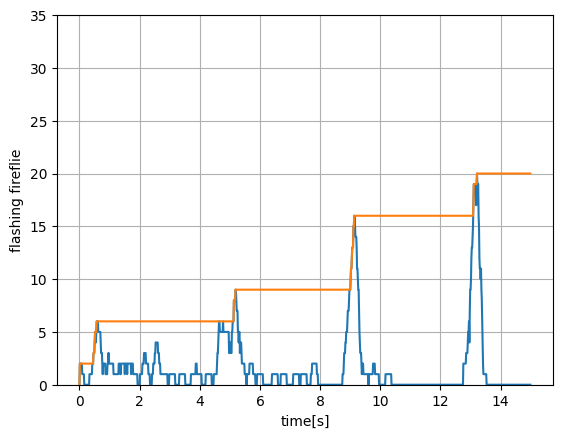

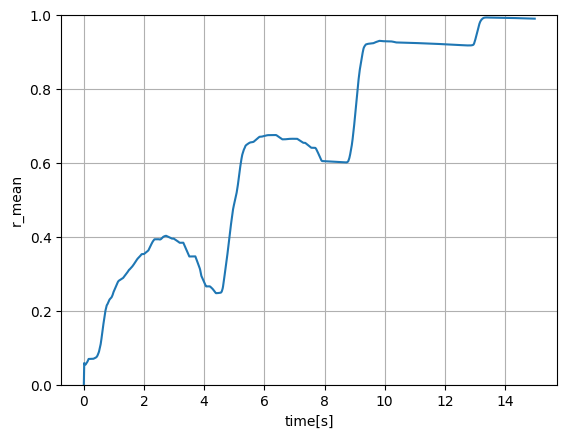

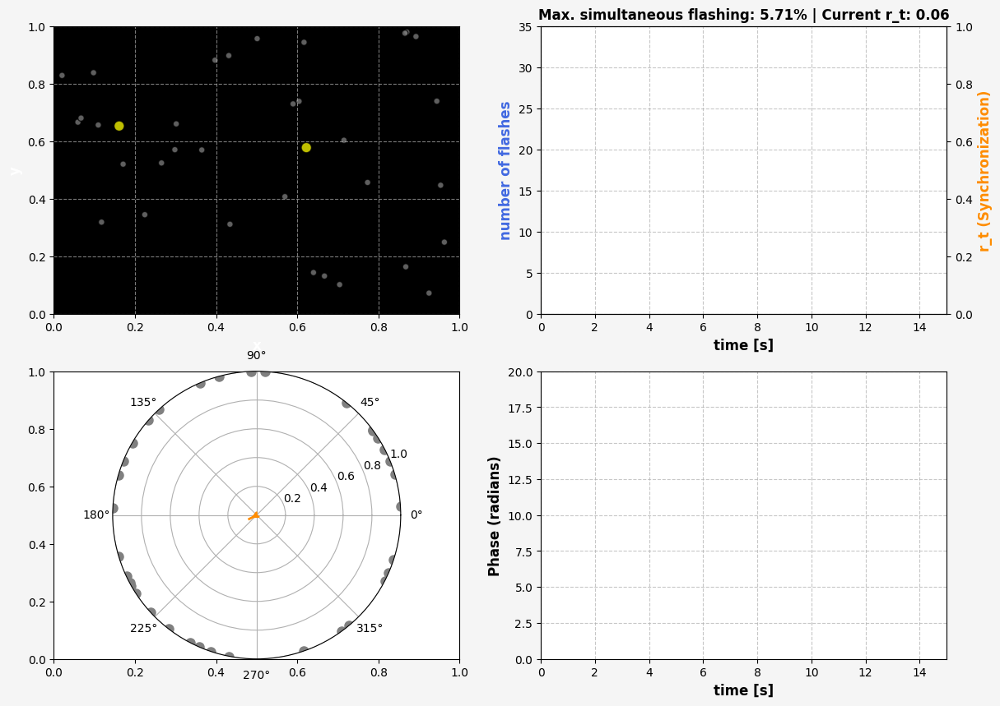

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from IPython.display import HTML



import numpy as np

class experiment:
    """
    object that defines one experiment
    """
    def __init__(self,duration,numff,flfrq,width_flfrq,fldur,rint,coupling_strength,moveparameter,vel):
        """
        initialize the experiment
        """
        self.flfrq     = flfrq
        self.width_flfrq = width_flfrq
        self.fldur = fldur

        if fldur>(0.5/flfrq):
            raise ValueError("flash duration can be maximum  half of the inverse flash frequency")

        self.rint = rint
        self.coupling_strength = coupling_strength
        self.vel =  vel
        self.number_fireflies    = numff
        self.duration =  duration
        self.dt = min(self.fldur/15/self.coupling_strength,self.fldur/15.)
        self.iters = int(duration/self.dt)
        self.moveparameter = moveparameter
        self.flash_counter = np.zeros(self.iters)
        self.max_sim_flashs = np.zeros(self.iters)
        self.r_t = np.zeros(self.iters)

        # init fireflies
        self.firefly_list = []
        for i in range(self.number_fireflies):
            self.firefly_list.append(firefly(self.flfrq,self.width_flfrq,self.fldur,self.rint,self.coupling_strength,self.moveparameter,self.vel,self.dt))


    def run(self):
        """
        run the experiment for the chosen setting
        """
        t=0
        while True:
            self.print_status(t)
            self.time_stepper()
            flash_counter_t = self.count_flashs()
            t+=1

            # stop the integration if maximum number of iteration was reached or
            # if all fireflies are flashing
            if t>self.iters-1 or max(self.flash_counter)==self.number_fireflies:
                self.max_sim_flashs[t:]=self.number_fireflies
                self.r_t[t:] = 1.
                break

            self.flash_counter[t] = flash_counter_t
            self.max_sim_flashs[t] = max(self.flash_counter)
            self.r_t[t] =r_t_i(self.number_fireflies,self.firefly_list)


    def print_status(self,t):
        """ prints current sync state of the model"""

        test_print = t % 1000
        if test_print == 0.:
            print ("Time:" + str(t*self.dt)+ "s, Sync:"+ str(self.max_sim_flashs[t]/self.number_fireflies *100.)+"%")

    def time_stepper(self):
        """performs one time step in integration for the model"""
        for i in range(self.number_fireflies):
            # time integration
            self.firefly_list[i].timeIntegration()

            # let the fireflies interact
            for j in range(self.number_fireflies):
                self.firefly_list[i].interact(self.firefly_list[j])

    def count_flashs(self):
        """ counts the number of flashing fireflies at the current time step"""
        flash_counter =0.
        for i in range(self.number_fireflies):
            flash_counter = flash_counter +  self.firefly_list[i].flash

        return flash_counter



class firefly():
    """
    object that defines the properties of one firefly
    """
    def __init__(self,flfrq,width_flfrq,fldur,rint,coupling_strength,moveparameter,vel,dt):
        """
        initialize the firefly properties
        """
        # initialize variables from settings
        self.flash_freq     = np.random.uniform(low=flfrq-width_flfrq,high=flfrq+width_flfrq)
        self.flash_duration = fldur
        self.thresold_flash = np.sin(np.pi/2.-self.flash_duration*self.flash_freq*np.pi)
        self.r_interaction  = rint
        self.coupling_strength = coupling_strength
        self.moveparameter = moveparameter
        self.maxabsvel = vel
        self.maxvel = vel
        self.l = 1.0
        self.dt = dt

        # random initialization of other variables
        self.x = np.random.uniform(low=0.,high=self.l)
        self.y = np.random.uniform(low=0.,high=self.l)
        self.intrinsic_omega    = 2*np.pi * self.flash_freq # np.random.uniform(low=0.9,high=1.0)
        self.omega    = self.intrinsic_omega
        self.theta    = np.random.uniform(low=0.,high=2*np.pi)
        self.flash    = flash(self.theta,self.thresold_flash)
        self.uvel     = np.random.uniform(low=-self.maxvel,high=self.maxvel)
        self.vvel     = np.random.uniform(low=-self.maxvel,high=self.maxvel)

    def timeIntegration(self):
        """
        integrate the model:
            - move the clock of a firefly
            - move the firefly on the grid (if moveparameter == True)
        """
        self.theta = self.theta + self.dt*self.omega % (2*np.pi)
        self.flash = flash(self.theta,self.thresold_flash)
        if self.moveparameter:
            self.move()
            self.change_velocity()

    def interact(self,other_firefly):
        """
        interaction of a firefly with a other fireflies in its vicinity
        """
        Dx = other_firefly.x - self.x
        Dy =  other_firefly.y - self.y
        r = distance(Dx,Dy)

        if r!=0. and r<=self.r_interaction and self.flash==0. and other_firefly.flash==1.:
            self.theta = self.theta + np.sin(other_firefly.theta - self.theta) *self.coupling_strength*self.dt #% (2*np.pi) --> does not work caouse other.theta will also interact again!!! and if modlulo
            #other.theta +=self.K*self.dt

    def move(self):
        """
        move a firefly
        """
        dx = self.uvel*self.dt
        dy = self.vvel*self.dt
        self.x = (self.x +dx) % self.l
        self.y = (self.y +dy) % self.l

    def change_velocity(self):
        """
        generate a new velocity vector
        """
        self.uvel     = self.uvel+np.random.uniform(low=-self.maxvel/10.,high=self.maxvel/10.)
        self.vvel     = self.vvel+np.random.uniform(low=-self.maxvel/10.,high=self.maxvel/10.)

# =============================================================================
# Some functions
# =============================================================================
# if a fireflie flashs than return 1.0, if not return 0.0
def flash(theta,thresold_flash):
    if np.sin(theta)>thresold_flash:
        return 1.
    else:
        return 0.

#calculate the distance between two points
def distance(x,y):
    return np.sqrt(x**2+y**2)

def r_t_i(nff,Fireflies):
    dummy = 0.
    for i in range(nff):
        dummy =  dummy + np.exp(1.0j * Fireflies[i].theta)
    return 1/float(nff) * np.abs(dummy)

def r_mean(r,T,T_0,iters):
    i_0 = int(T_0 * float(iters)/(T+T_0))
    return np.mean(r[i_0:])


# experiment parameters
duration = 15.
numff    = 35

# firefly  parameters
f    =  0.25
Delta_f = 0.01
T_flash   =  0.2
r_int    = 0.5
K = 0.8
move = True
maxvel  = 0.08

np.random.seed(0)
exp = experiment(duration,
                 numff,
                 f,
                 Delta_f,
                 T_flash,r_int,
                 K,
                 move,
                 maxvel)

# Run the model
exp.run()

# Plot some results
timeArray = np.arange(exp.iters)*exp.dt
plt.figure(1)
plt.plot(timeArray,exp.flash_counter)
plt.plot(timeArray,exp.max_sim_flashs)
plt.xlabel("time[s]")
plt.ylabel("flashing fireflie")
plt.ylim(0,exp.number_fireflies)
plt.grid()

plt.figure(2)
plt.plot(timeArray,exp.r_t)
plt.xlabel("time[s]")
plt.ylabel("r_mean")
plt.grid()
plt.ylim(0,1)
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

# Set random seed for reproducibility
np.random.seed(0)

# Define and initialize experiment parameters
exp = experiment(duration, numff, f, Delta_f, T_flash, r_int, K, move, maxvel)

# Set up the main figure with four subplots in a 2x2 grid
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
fig.patch.set_facecolor('whitesmoke')  # Background color for the entire figure

# Scatter plot in (x, y) coordinates (Top-Left)
ax_scatter = axs[0, 0]
ax_scatter.set_facecolor('black')  # Set background color to black
ax_scatter.grid(True, linestyle='--', alpha=0.7)
ax_scatter.set_xlabel("x", fontsize=12, fontweight='bold', color='white')
ax_scatter.set_ylabel("y", fontsize=12, fontweight='bold', color='white')
ax_scatter.set_xlim(0, 1)
ax_scatter.set_ylim(0, 1)
sc = ax_scatter.scatter([], [], s=60, alpha=0.75, edgecolors='k')

# Flash count and r_t plot over time (Top-Right)
ax_time = axs[0, 1]
ax_time.grid(True, linestyle='--', alpha=0.7)
ax_time.set_xlabel("time [s]", fontsize=12, fontweight='bold')
ax_time.set_xlim(0, duration)
ax_time.set_ylim(0, numff)

# Flash count line
line_flash, = ax_time.plot([], [], lw=2, color='royalblue', label="Flash Count")
ax_time.fill_between([], [], color='lightblue', alpha=0.3)
ax_time.set_ylabel("number of flashes", fontsize=12, fontweight='bold', color='royalblue')

# Synchronization measure r_t on a second y-axis
ax2 = ax_time.twinx()
line_rt, = ax2.plot([], [], lw=2, color='darkorange', label="r_t (Sync Measure)")
ax2.set_ylim(0, 1)
ax2.set_ylabel("r_t (Synchronization)", fontsize=12, fontweight='bold', color='darkorange')

# Polar plot for phase synchronization (Bottom-Left)
ax_polar = axs[1, 0]
ax_polar = fig.add_subplot(223, projection='polar')
ax_polar.set_ylim(0, 1)  # r-axis range for the synchronization measure
phase_points, = ax_polar.plot([], [], 'o', color='gray', markersize=8)
sync_line, = ax_polar.plot([], [], color='darkorange', lw=2)  # Line showing r_t radius
arrow = ax_polar.annotate('', xy=(0, 0), xytext=(0, 0), arrowprops=dict(arrowstyle="->", color='darkorange', lw=2))

# Trace line for the arrow's trajectory
trace_line, = ax_polar.plot([], [], color='orange', lw=1, alpha=0.5)

# Phase vs. time plot (Bottom-Right)
ax_phase_time = axs[1, 1]
ax_phase_time.set_xlabel("time [s]", fontsize=12, fontweight='bold')
ax_phase_time.set_ylabel("Phase (radians)", fontsize=12, fontweight='bold')
ax_phase_time.set_xlim(0, duration)
ax_phase_time.set_ylim(0, 20)
ax_phase_time.grid(True, linestyle='--', alpha=0.7)

# Initial lines for each firefly's phase over time
phase_lines = [
    ax_phase_time.plot([], [], lw=1, alpha=0.6, label=f"Firefly {i+1}")[0]
    for i in range(exp.number_fireflies)
]

# Lists to store flash counts, r_t values, and phase trajectories over time
nflashs = []
rt_values = []
phase_trajectories = [[] for _ in range(exp.number_fireflies)]
trace_x = []
trace_y = []

def animate(frame_num):
    """Update function for each frame in the animation."""

    # Update the experiment to the next time step
    exp.time_stepper()

    # Firefly positions and flash states
    x = [firefly.x for firefly in exp.firefly_list]
    y = [firefly.y for firefly in exp.firefly_list]
    colors = ["yellow" if firefly.flash == 1.0 else 'gray' for firefly in exp.firefly_list]
    sizes = [80 if color == "yellow" else 30 for color in colors]

    # Update scatter plot in (x, y)
    sc.set_offsets(np.c_[x, y])
    sc.set_facecolors(colors)
    sc.set_sizes(sizes)

    # Update flash counts and r_t
    nflashs.append(exp.count_flashs())
    rt_value = r_t_i(exp.number_fireflies, exp.firefly_list)
    rt_values.append(rt_value)
    time = np.linspace(0, len(nflashs) * exp.dt, len(nflashs))

    # Flash count plot
    line_flash.set_data(time, nflashs)
    ax_time.fill_between(time, nflashs, color='lightblue', alpha=0.3)

    # r_t line plot
    line_rt.set_data(time, rt_values)

    # Calculate average phase for r_t direction in polar plot
    phases = np.array([firefly.theta for firefly in exp.firefly_list])
    avg_phase = np.angle(np.sum(np.exp(1j * phases)) / exp.number_fireflies)  # Mean phase angle
    phase_points.set_data(phases, [1] * len(phases))  # All fireflies placed at r=1
    sync_line.set_data([0, avg_phase], [0, rt_value])  # Sync line with r_t as radius and avg_phase as angle

    # Update arrow position at the tip of r_t line
    arrow.xy = (avg_phase, rt_value)

    # Store current polar coordinates for the trace
    trace_x.append(avg_phase)
    trace_y.append(rt_value)

    # Update trace line to show the trajectory
    trace_line.set_data(trace_x, trace_y)

    # Update phase vs. time plot for each firefly
    for i, (firefly, line) in enumerate(zip(exp.firefly_list, phase_lines)):
        phase_trajectories[i].append(firefly.theta)
        line.set_data(time, phase_trajectories[i])  # Set the phase trajectory data

    # Title for synchronization and flash count
    ax_time.set_title(
        f"Max. simultaneous flashing: {max(nflashs) / exp.number_fireflies * 100:.2f}% | Current r_t: {rt_value:.2f}",
        fontsize=12, fontweight='bold'
    )

# Create and display the animation
ani = animation.FuncAnimation(
    fig, animate, frames=exp.iters, interval=20, repeat=False
)



#HTML(ani.to_html5_video())

For more number of fireflies N=75 and duration=40s

Time:0.0s, Sync:0.0%
Time:13.333333333333334s, Sync:44.0%
Time:26.666666666666668s, Sync:69.33333333333334%


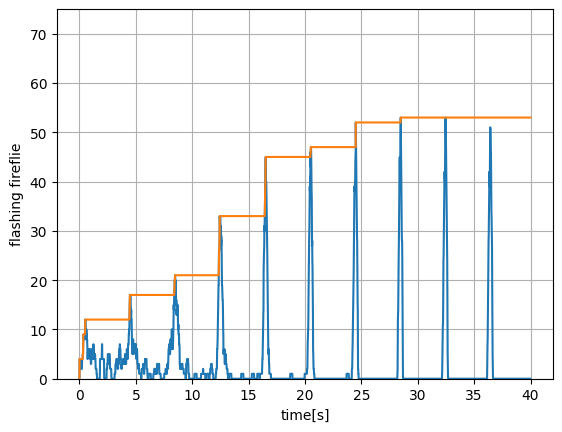

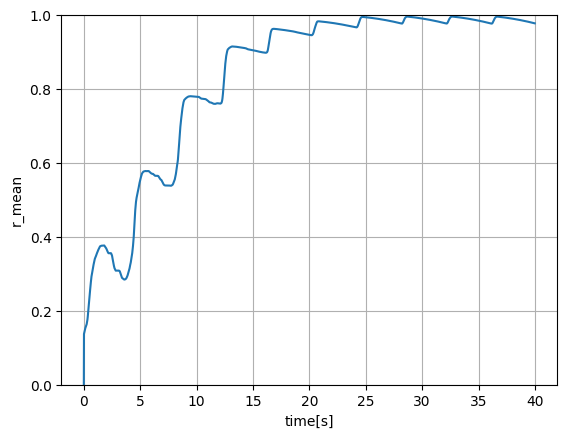

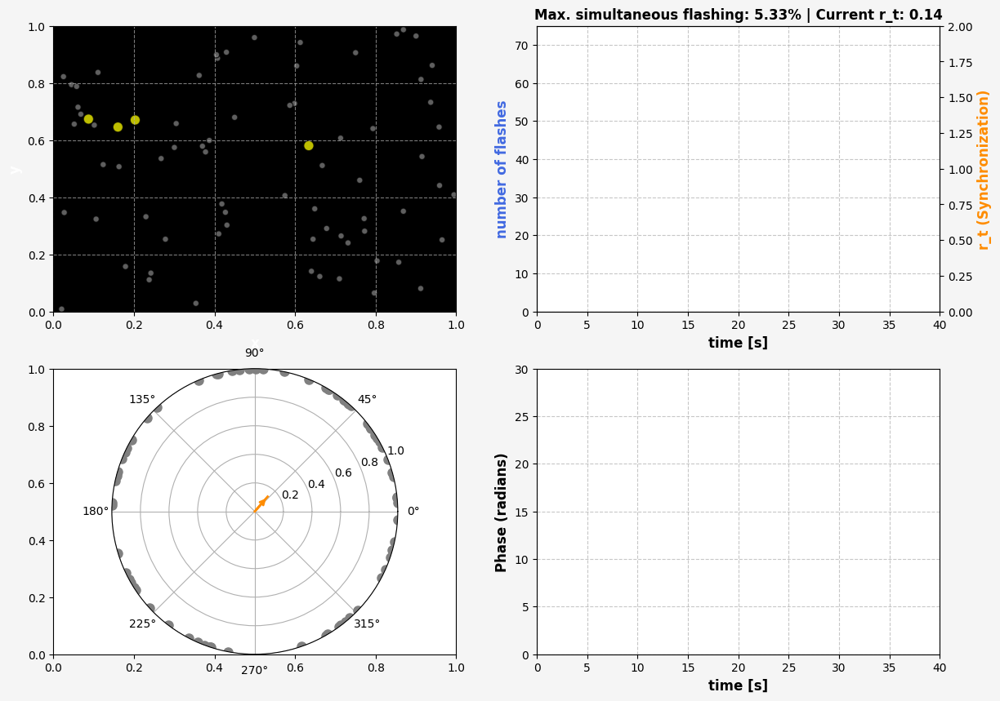

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from IPython.display import HTML



import numpy as np

class experiment:
    """
    object that defines one experiment
    """
    def __init__(self,duration,numff,flfrq,width_flfrq,fldur,rint,coupling_strength,moveparameter,vel):
        """
        initialize the experiment
        """
        self.flfrq     = flfrq
        self.width_flfrq = width_flfrq
        self.fldur = fldur

        if fldur>(0.5/flfrq):
            raise ValueError("flash duration can be maximum  half of the inverse flash frequency")

        self.rint = rint
        self.coupling_strength = coupling_strength
        self.vel =  vel
        self.number_fireflies    = numff
        self.duration =  duration
        self.dt = min(self.fldur/15/self.coupling_strength,self.fldur/15.)
        self.iters = int(duration/self.dt)
        self.moveparameter = moveparameter
        self.flash_counter = np.zeros(self.iters)
        self.max_sim_flashs = np.zeros(self.iters)
        self.r_t = np.zeros(self.iters)

        # init fireflies
        self.firefly_list = []
        for i in range(self.number_fireflies):
            self.firefly_list.append(firefly(self.flfrq,self.width_flfrq,self.fldur,self.rint,self.coupling_strength,self.moveparameter,self.vel,self.dt))


    def run(self):
        """
        run the experiment for the chosen setting
        """
        t=0
        while True:
            self.print_status(t)
            self.time_stepper()
            flash_counter_t = self.count_flashs()
            t+=1

            # stop the integration if maximum number of iteration was reached or
            # if all fireflies are flashing
            if t>self.iters-1 or max(self.flash_counter)==self.number_fireflies:
                self.max_sim_flashs[t:]=self.number_fireflies
                self.r_t[t:] = 1.
                break

            self.flash_counter[t] = flash_counter_t
            self.max_sim_flashs[t] = max(self.flash_counter)
            self.r_t[t] =r_t_i(self.number_fireflies,self.firefly_list)


    def print_status(self,t):
        """ prints current sync state of the model"""

        test_print = t % 1000
        if test_print == 0.:
            print ("Time:" + str(t*self.dt)+ "s, Sync:"+ str(self.max_sim_flashs[t]/self.number_fireflies *100.)+"%")

    def time_stepper(self):
        """performs one time step in integration for the model"""
        for i in range(self.number_fireflies):
            # time integration
            self.firefly_list[i].timeIntegration()

            # let the fireflies interact
            for j in range(self.number_fireflies):
                self.firefly_list[i].interact(self.firefly_list[j])

    def count_flashs(self):
        """ counts the number of flashing fireflies at the current time step"""
        flash_counter =0.
        for i in range(self.number_fireflies):
            flash_counter = flash_counter +  self.firefly_list[i].flash

        return flash_counter



class firefly():
    """
    object that defines the properties of one firefly
    """
    def __init__(self,flfrq,width_flfrq,fldur,rint,coupling_strength,moveparameter,vel,dt):
        """
        initialize the firefly properties
        """
        # initialize variables from settings
        self.flash_freq     = np.random.uniform(low=flfrq-width_flfrq,high=flfrq+width_flfrq)
        self.flash_duration = fldur
        self.thresold_flash = np.sin(np.pi/2.-self.flash_duration*self.flash_freq*np.pi)
        self.r_interaction  = rint
        self.coupling_strength = coupling_strength
        self.moveparameter = moveparameter
        self.maxabsvel = vel
        self.maxvel = vel
        self.l = 1.0
        self.dt = dt

        # random initialization of other variables
        self.x = np.random.uniform(low=0.,high=self.l)
        self.y = np.random.uniform(low=0.,high=self.l)
        self.intrinsic_omega    = 2*np.pi * self.flash_freq # np.random.uniform(low=0.9,high=1.0)
        self.omega    = self.intrinsic_omega
        self.theta    = np.random.uniform(low=0.,high=2*np.pi)
        self.flash    = flash(self.theta,self.thresold_flash)
        self.uvel     = np.random.uniform(low=-self.maxvel,high=self.maxvel)
        self.vvel     = np.random.uniform(low=-self.maxvel,high=self.maxvel)

    def timeIntegration(self):
        """
        integrate the model:
            - move the clock of a firefly
            - move the firefly on the grid (if moveparameter == True)
        """
        self.theta = self.theta + self.dt*self.omega % (2*np.pi)
        self.flash = flash(self.theta,self.thresold_flash)
        if self.moveparameter:
            self.move()
            self.change_velocity()

    def interact(self,other_firefly):
        """
        interaction of a firefly with a other fireflies in its vicinity
        """
        Dx = other_firefly.x - self.x
        Dy =  other_firefly.y - self.y
        r = distance(Dx,Dy)

        if r!=0. and r<=self.r_interaction and self.flash==0. and other_firefly.flash==1.:
            self.theta = self.theta + np.sin(other_firefly.theta - self.theta) *self.coupling_strength*self.dt #% (2*np.pi) --> does not work caouse other.theta will also interact again!!! and if modlulo
            #other.theta +=self.K*self.dt

    def move(self):
        """
        move a firefly
        """
        dx = self.uvel*self.dt
        dy = self.vvel*self.dt
        self.x = (self.x +dx) % self.l
        self.y = (self.y +dy) % self.l

    def change_velocity(self):
        """
        generate a new velocity vector
        """
        self.uvel     = self.uvel+np.random.uniform(low=-self.maxvel/10.,high=self.maxvel/10.)
        self.vvel     = self.vvel+np.random.uniform(low=-self.maxvel/10.,high=self.maxvel/10.)

# =============================================================================
# Some functions
# =============================================================================
# if a fireflie flashs than return 1.0, if not return 0.0
def flash(theta,thresold_flash):
    if np.sin(theta)>thresold_flash:
        return 1.
    else:
        return 0.

#calculate the distance between two points
def distance(x,y):
    return np.sqrt(x**2+y**2)

def r_t_i(nff,Fireflies):
    dummy = 0.
    for i in range(nff):
        dummy =  dummy + np.exp(1.0j * Fireflies[i].theta)
    return 1/float(nff) * np.abs(dummy)

def r_mean(r,T,T_0,iters):
    i_0 = int(T_0 * float(iters)/(T+T_0))
    return np.mean(r[i_0:])


# experiment parameters
duration = 40.
numff    = 75

# firefly  parameters
f    =  0.25
Delta_f = 0.01
T_flash   =  0.2
r_int    = 0.5
K = 0.18
move = True
maxvel  = 1.08

np.random.seed(0)
exp = experiment(duration,
                 numff,
                 f,
                 Delta_f,
                 T_flash,r_int,
                 K,
                 move,
                 maxvel)

# Run the model
exp.run()

# Plot some results
timeArray = np.arange(exp.iters)*exp.dt
plt.figure(1)
plt.plot(timeArray,exp.flash_counter)
plt.plot(timeArray,exp.max_sim_flashs)
plt.xlabel("time[s]")
plt.ylabel("flashing fireflie")
plt.ylim(0,exp.number_fireflies)
plt.grid()

plt.figure(2)
plt.plot(timeArray,exp.r_t)
plt.xlabel("time[s]")
plt.ylabel("r_mean")
plt.grid()
plt.ylim(0,1)
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

# Set random seed for reproducibility
np.random.seed(0)

# Define and initialize experiment parameters
exp = experiment(duration, numff, f, Delta_f, T_flash, r_int, K, move, maxvel)

# Set up the main figure with four subplots in a 2x2 grid
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
fig.patch.set_facecolor('whitesmoke')  # Background color for the entire figure

# Scatter plot in (x, y) coordinates (Top-Left)
ax_scatter = axs[0, 0]
ax_scatter.set_facecolor('black')  # Set background color to black
ax_scatter.grid(True, linestyle='--', alpha=0.7)
ax_scatter.set_xlabel("x", fontsize=12, fontweight='bold', color='white')
ax_scatter.set_ylabel("y", fontsize=12, fontweight='bold', color='white')
ax_scatter.set_xlim(0, 1)
ax_scatter.set_ylim(0, 1)
sc = ax_scatter.scatter([], [], s=60, alpha=0.75, edgecolors='k')

# Flash count and r_t plot over time (Top-Right)
ax_time = axs[0, 1]
ax_time.grid(True, linestyle='--', alpha=0.7)
ax_time.set_xlabel("time [s]", fontsize=12, fontweight='bold')
ax_time.set_xlim(0, duration)
ax_time.set_ylim(0, numff)

# Flash count line
line_flash, = ax_time.plot([], [], lw=2, color='royalblue', label="Flash Count")
ax_time.fill_between([], [], color='lightblue', alpha=0.3)
ax_time.set_ylabel("number of flashes", fontsize=12, fontweight='bold', color='royalblue')

# Synchronization measure r_t on a second y-axis
ax2 = ax_time.twinx()
line_rt, = ax2.plot([], [], lw=2, color='darkorange', label="r_t (Sync Measure)")
ax2.set_ylim(0, 2)
ax2.set_ylabel("r_t (Synchronization)", fontsize=12, fontweight='bold', color='darkorange')

# Polar plot for phase synchronization (Bottom-Left)
ax_polar = axs[1, 0]
ax_polar = fig.add_subplot(223, projection='polar')
ax_polar.set_ylim(0, 1)  # r-axis range for the synchronization measure
phase_points, = ax_polar.plot([], [], 'o', color='gray', markersize=8)
sync_line, = ax_polar.plot([], [], color='darkorange', lw=2)  # Line showing r_t radius
arrow = ax_polar.annotate('', xy=(0, 0), xytext=(0, 0), arrowprops=dict(arrowstyle="->", color='darkorange', lw=2))

# Trace line for the arrow's trajectory
trace_line, = ax_polar.plot([], [], color='orange', lw=1, alpha=0.5)

# Phase vs. time plot (Bottom-Right)
ax_phase_time = axs[1, 1]
ax_phase_time.set_xlabel("time [s]", fontsize=12, fontweight='bold')
ax_phase_time.set_ylabel("Phase (radians)", fontsize=12, fontweight='bold')
ax_phase_time.set_xlim(0, duration)
ax_phase_time.set_ylim(0, 30)
ax_phase_time.grid(True, linestyle='--', alpha=0.7)

# Initial lines for each firefly's phase over time
phase_lines = [
    ax_phase_time.plot([], [], lw=1, alpha=0.6, label=f"Firefly {i+1}")[0]
    for i in range(exp.number_fireflies)
]

# Lists to store flash counts, r_t values, and phase trajectories over time
nflashs = []
rt_values = []
phase_trajectories = [[] for _ in range(exp.number_fireflies)]
trace_x = []
trace_y = []

def animate(frame_num):
    """Update function for each frame in the animation."""

    # Update the experiment to the next time step
    exp.time_stepper()

    # Firefly positions and flash states
    x = [firefly.x for firefly in exp.firefly_list]
    y = [firefly.y for firefly in exp.firefly_list]
    colors = ["yellow" if firefly.flash == 1.0 else 'gray' for firefly in exp.firefly_list]
    sizes = [80 if color == "yellow" else 30 for color in colors]

    # Update scatter plot in (x, y)
    sc.set_offsets(np.c_[x, y])
    sc.set_facecolors(colors)
    sc.set_sizes(sizes)

    # Update flash counts and r_t
    nflashs.append(exp.count_flashs())
    rt_value = r_t_i(exp.number_fireflies, exp.firefly_list)
    rt_values.append(rt_value)
    time = np.linspace(0, len(nflashs) * exp.dt, len(nflashs))

    # Flash count plot
    line_flash.set_data(time, nflashs)
    ax_time.fill_between(time, nflashs, color='lightblue', alpha=0.3)

    # r_t line plot
    line_rt.set_data(time, rt_values)

    # Calculate average phase for r_t direction in polar plot
    phases = np.array([firefly.theta for firefly in exp.firefly_list])
    avg_phase = np.angle(np.sum(np.exp(1j * phases)) / exp.number_fireflies)  # Mean phase angle
    phase_points.set_data(phases, [1] * len(phases))  # All fireflies placed at r=1
    sync_line.set_data([0, avg_phase], [0, rt_value])  # Sync line with r_t as radius and avg_phase as angle

    # Update arrow position at the tip of r_t line
    arrow.xy = (avg_phase, rt_value)

    # Store current polar coordinates for the trace
    trace_x.append(avg_phase)
    trace_y.append(rt_value)

    # Update trace line to show the trajectory
    trace_line.set_data(trace_x, trace_y)

    # Update phase vs. time plot for each firefly
    for i, (firefly, line) in enumerate(zip(exp.firefly_list, phase_lines)):
        phase_trajectories[i].append(firefly.theta)
        line.set_data(time, phase_trajectories[i])  # Set the phase trajectory data

    # Title for synchronization and flash count
    ax_time.set_title(
        f"Max. simultaneous flashing: {max(nflashs) / exp.number_fireflies * 100:.2f}% | Current r_t: {rt_value:.2f}",
        fontsize=12, fontweight='bold'
    )

# Create and display the animation
ani = animation.FuncAnimation(
    fig, animate, frames=exp.iters, interval=20, repeat=False
)


#HTML(ani.to_html5_video())
